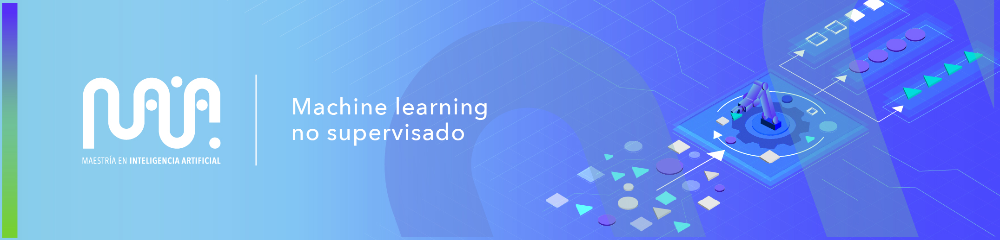

# **Machine Learning No Supervisado**

### **SERGIO MASSO GIRALDO & IVAN LEONARDO GONZALEZ CRUZ**
### **UNIVERSIDAD DE LOS ANDES**
### **Microproyecto 1**

### Generación de paleta de colores a partir de imágenes con técnicas de machine learning no supervisado

Una paleta de colores es un conjunto de tonos que se utilizan juntos para crear un efecto armonioso, coherente y atractivo en las representaciones visuales (diseño gráfico, cine, fotografía, pintura, etc.), así como para transmitir mensajes y generar emociones determinados, de acuerdo con la intencionalidad del autor de la obra.

En un contexto de amplia demanda de herramientas que puedan asistir a diseñadores gráficos, directores de arte, pintores y creadores de contenido, entre otros, para la selección rápida y adecuada de los colores apropiados para sus obras, una aplicación para configurar paletas de colores a partir de imágenes sería de mucha utilidad. 

El problema central radica en desarrollar un método automatizado que pueda generar una paleta coherente y estéticamente atractiva partiendo de los colores identificados en una imagen. Esto implica no solo reconocer tonos dominantes, sino también comprender la relación existente al interior de la gama cromática empleada para crear combinaciones visuales agradables y funcionales. Abordar este problema se traduciría en varias ventajas:

- Eficiencia en el proceso creativo, al liberar tiempo que los autores podrían emplear en otros aspectos estratégicos de sus proyectos.

- Consistencia interna en los diseños, manteniendo una identidad visual constante en diferentes aplicaciones y proyectos.

- Facilidad de uso y recurso de aprendizaje para personas con menos experiencia en diseño, fomentando la creatividad en diversos campos.

- Optimización de la calidad y del impacto de la comunicación visual. 

Una vía para lograr una herramienta como esta es utilizar técnicas de machine learning no supervisado sobre imágenes para visualizar la distribución de los colores dominantes presentes en estas y generar, de manera automática, modelos de paletas de colores. En esta primera aproximación el método va a permitir identificar los colores dominantes en una imagen para construir un muestrario por similitud de píxeles, lo cual puede ser muy útil para estudios de marketing, psicología, medicina, arte, ambiente, entre otros. Por ejemplo, se podrían extraer los colores de las diferentes superficies de la Tierra en una imagen satelital para estudiar la distribución de la vegetación o de la contaminación.

### A. Objetivo.

Desarrollar un método, basado en técnicas de agrupación, que permita extraer los tonos dominantes de una imagen y generar un muestrario de los colores representativos presentes en esta. 

### B. Conjunto de datos. 

Los datos están asociados con imágenes de obras de arte. Pueden ser descargados a partir de este
 enlace
.

### C. Actividades para realizar.

1. Recopilación de las imágenes a partir del repositorio. Se recomienda seleccionar entre 6 y 10 imágenes.

2. Preparación de las imágenes para el entrenamiento y prueba del modelo. Pipeline que integre las transformaciones que se consideren adecuadas.

3. Desarrollo del modelo de agrupación para identificar los colores dominantes en una imagen.

4. Transformación de los grupos de colores identificados en un muestrario representativo. Adicionalmente, se debería mostrar la distribución de los colores de la imagen en un espacio de dos dimensiones utilizando una técnica de reducción de la dimensionalidad.

### D. Consideraciones.

Un diagrama general del método que se quiere desarrollar se muestra en la siguiente la Fig. 1.

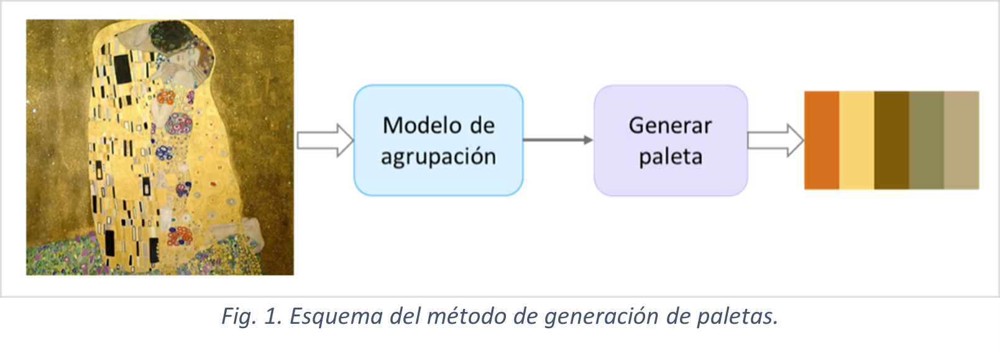

### Importacion de Librerias necesarias

In [ ]:
# Instalacion de librerias - Ingresar las librerias necesarias para el proyecto
%pip install --upgrade pip
%pip install pandas
%pip install numpy
%pip install scikit-learn
%pip install matplotlib
%pip install seaborn
%pip install opencv-python

In [ ]:
# Importación de librerías principales
import os
from pathlib import Path
from dataclasses import dataclass
from types import MappingProxyType
from typing import Any, Mapping

import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from IPython.display import display

from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth, HDBSCAN
from sklearn.metrics import silhouette_score, pairwise_distances_argmin
from sklearn.decomposition import PCA

plt.style.use("seaborn-v0_8")
sns.set_theme()
np.set_printoptions(precision=3, suppress=True)

print("Librerías importadas correctamente")


Librerías importadas correctamente


# **Desarrollo del problema**

### **Recopilacion de Imagenes**
1. Recopilación de un conjunto diverso de imágenes en diferentes estilos artísticos (al menos tres estilos o pintores), a partir del repositorio. Al comienzo del notebook se deben mostrar las imágenes seleccionadas (entre 6 – 10 imágenes), explicando, de manera breve, la motivación para su selección.

En esta sección se presenta una colección inicial de 10 imágenes seleccionadas de distintos artistas y estilos pictóricos, como parte del proceso de preparación de datos para un proyecto de machine learning no supervisado enfocado en clustering de imágenes artísticas.

La motivación para esta selección radica en reunir imágenes con diferentes estilos artísticos, paletas de color y composiciones visuales, lo que permitirá aplicar técnicas de agrupamiento (como K-Means o DBSCAN) para identificar patrones visuales y similitudes entre obras sin necesidad de etiquetas previas. Este conjunto servirá como base para analizar cómo los algoritmos de clustering pueden distinguir entre estilos pictóricos, temáticas y características visuales.

A continuacion se presenta una visual de cada una de las imagenes:

In [9]:
def crear_dataframe_imagenes(ruta, lista_info):
    data = []

    for info in lista_info:
        archivo = info["archivo"]
        artista = info["artista"]
        genero = info["genero"]

        path_img = os.path.join(ruta, archivo)

        if os.path.exists(path_img):
            data.append({
                "Imagen": archivo,
                "NombreArchivo": archivo,
                "Artista": artista,
                "Genero": genero
            })
        else:
            print(f"No se encontró la imagen: {archivo}")

    df = pd.DataFrame(data)
    return df


def ver_imagenes(df_imagenes, ruta, filas=5, columnas=2, limite=10):
    df_mostrar = df_imagenes.head(limite)

    fig, axes = plt.subplots(filas, columnas, figsize=(10, 12))
    axes = axes.flatten()

    for ax in axes:
        ax.axis("off")

    for i, fila in df_mostrar.iterrows():
        ruta_imagen = os.path.join(ruta, fila["Imagen"])
        img = Image.open(ruta_imagen)

        axes[i].imshow(img)
        axes[i].set_title(
            f'{fila["Artista"]}\n{fila["Genero"]}',
            fontsize=8
        )
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

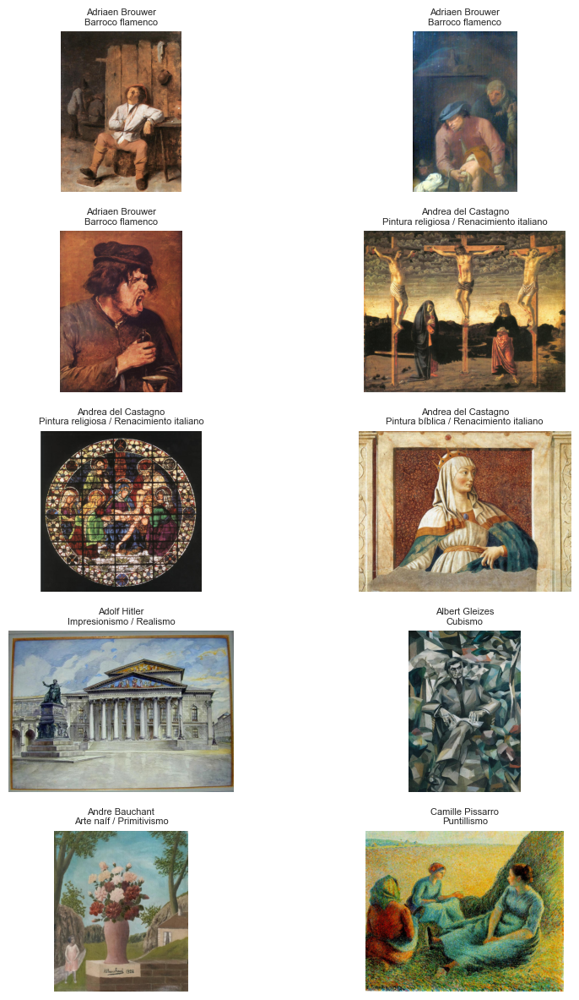

,Imagen,NombreArchivo,Artista,Genero
0,adriaen-brouwer_a-boor-asleep.jpg,adriaen-brouwer_a-boor-asleep.jpg,Adriaen Brouwer,Barroco flamenco
1,adriaen-brouwer_father-s-of-unpleasant-duties-...,adriaen-brouwer_father-s-of-unpleasant-duties-...,Adriaen Brouwer,Barroco flamenco
2,adriaen-brouwer_the-bitter-drunk.jpg,adriaen-brouwer_the-bitter-drunk.jpg,Adriaen Brouwer,Barroco flamenco
3,andrea-del-castagno_crucifixion-1.jpg,andrea-del-castagno_crucifixion-1.jpg,Andrea del Castagno,Pintura religiosa / Renacimiento italiano
4,andrea-del-castagno_deposition-of-christ.jpg,andrea-del-castagno_deposition-of-christ.jpg,Andrea del Castagno,Pintura religiosa / Renacimiento italiano
5,andrea-del-castagno_queen-esther.jpg,andrea-del-castagno_queen-esther.jpg,Andrea del Castagno,Pintura bíblica / Renacimiento italiano
6,adolf-hitler_the-munich-opera-house.jpg,adolf-hitler_the-munich-opera-house.jpg,Adolf Hitler,Impresionismo / Realismo
7,albert-gleizes_portrait-de-jacques-nayral-1911...,albert-gleizes_portrait-de-jacques-nayral-1911...,Albert Gleizes,Cubismo
8,andre-bauchant_le-bouquet-1928.jpg,andre-bauchant_le-bouquet-1928.jpg,Andre Bauchant,Arte naíf / Primitivismo
9,camille-pissarro_haymakers-resting-1891.jpg,camille-pissarro_haymakers-resting-1891.jpg,Camille Pissarro,Puntillismo


In [10]:
ruta = "Data"

lista_info = [
    {"archivo": "adriaen-brouwer_a-boor-asleep.jpg", "artista": "Adriaen Brouwer", "genero": "Barroco flamenco"},
    {"archivo": "adriaen-brouwer_father-s-of-unpleasant-duties-1631.jpg", "artista": "Adriaen Brouwer", "genero": "Barroco flamenco"},
    {"archivo": "adriaen-brouwer_the-bitter-drunk.jpg", "artista": "Adriaen Brouwer", "genero": "Barroco flamenco"},
    {"archivo": "andrea-del-castagno_crucifixion-1.jpg", "artista": "Andrea del Castagno", "genero": "Pintura religiosa / Renacimiento italiano"},
    {"archivo": "andrea-del-castagno_deposition-of-christ.jpg", "artista": "Andrea del Castagno", "genero": "Pintura religiosa / Renacimiento italiano"},
    {"archivo": "andrea-del-castagno_queen-esther.jpg", "artista": "Andrea del Castagno", "genero": "Pintura bíblica / Renacimiento italiano"},
    {"archivo": "adolf-hitler_the-munich-opera-house.jpg", "artista": "Adolf Hitler", "genero": "Impresionismo / Realismo"},
    {"archivo": "albert-gleizes_portrait-de-jacques-nayral-1911.jpg", "artista": "Albert Gleizes", "genero": "Cubismo"},
    {"archivo": "andre-bauchant_le-bouquet-1928.jpg", "artista": "Andre Bauchant", "genero": "Arte naíf / Primitivismo"},
    {"archivo": "camille-pissarro_haymakers-resting-1891.jpg", "artista": "Camille Pissarro", "genero": "Puntillismo"}
]

df_imagenes = crear_dataframe_imagenes(ruta, lista_info)

ver_imagenes(
    df_imagenes,
    ruta,
    filas=5,
    columnas=2,
    limite=10
)

df_imagenes

### **Preparación de los datos**

Cada transformación se implementa como una función independiente. Las funciones no dibujan, no imprimen y no dependen de variables globales; las celdas posteriores visualizan sus resultados. Esta separación permite reutilizarlas posteriormente dentro de una clase pipeline sin duplicar lógica.

## **1. Estandarización de la imagen**

OpenCV decodifica las imágenes a color en orden BGR. El contrato interno del proyecto será RGB/sRGB porque Matplotlib y las salidas de paleta utilizan RGB. `COLOR_BGR2RGB` cambia el orden de canales, pero no transforma perfiles ICC: por ello sRGB se declara como precondición del conjunto de datos.

La función valida tres canales, opacidad y 8 bits. Rechazar entradas incompatibles evita perder alfa o profundidad sin advertencia. La lectura `IMREAD_COLOR` permite que el códec gestione la orientación EXIF disponible.

In [19]:
@dataclass(frozen=True)
class ImagenEstandarizada:
    rgb: np.ndarray
    mascara_valida: np.ndarray
    metadatos: Mapping[str, Any]

def estandarizar_imagen(
    ruta: str | Path,
    *,
    espacio_color_entrada: str = "sRGB",
) -> ImagenEstandarizada:
    '''Carga una imagen opaca de 8 bits y establece RGB/sRGB como contrato.'''
    ruta = Path(ruta).expanduser().resolve()
    if not ruta.is_file():
        raise FileNotFoundError(f"No se encontró la imagen: {ruta}")
    if espacio_color_entrada.strip().lower() != "srgb":
        raise ValueError("Esta versión solo acepta imágenes declaradas como sRGB.")

    sin_cambios = cv2.imread(str(ruta), cv2.IMREAD_UNCHANGED)
    if sin_cambios is None:
        raise ValueError(f"OpenCV no pudo decodificar: {ruta}")
    if sin_cambios.ndim != 3 or sin_cambios.shape[2] != 3:
        raise ValueError(f"Se requieren tres canales opacos; forma recibida: {sin_cambios.shape}.")
    if sin_cambios.dtype != np.uint8:
        raise ValueError(f"Se requieren 8 bits por canal; dtype recibido: {sin_cambios.dtype}.")

    bgr = cv2.imread(str(ruta), cv2.IMREAD_COLOR)
    if bgr is None:
        raise ValueError(f"OpenCV no pudo cargar la imagen a color: {ruta}")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    mascara = np.ones(rgb.shape[:2], dtype=np.bool_)
    rgb.setflags(write=False)
    mascara.setflags(write=False)

    alto_crudo, ancho_crudo = sin_cambios.shape[:2]
    alto, ancho = rgb.shape[:2]
    metadatos = MappingProxyType({
        "archivo": ruta.name,
        "OpenCV": cv2.__version__,
        "tamaño decodificado": (ancho_crudo, alto_crudo),
        "tamaño de salida": (ancho, alto),
        "canales": "RGB",
        "espacio declarado": "sRGB",
        "dtype": str(rgb.dtype),
        "perfil ICC aplicado": False,
        "orientación cambió geometría": (ancho_crudo, alto_crudo) != (ancho, alto),
    })
    return ImagenEstandarizada(rgb, mascara, metadatos)

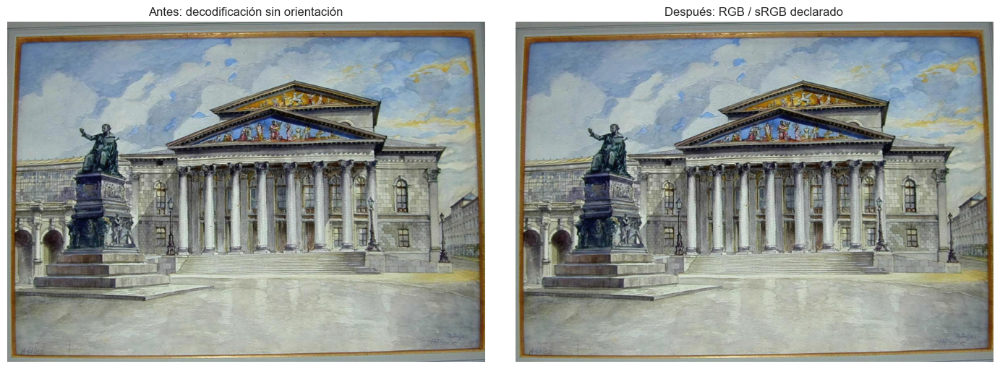

,valor
archivo,adolf-hitler_the-munich-opera-house.jpg
OpenCV,5.0.0
tamaño decodificado,"(1936, 1382)"
tamaño de salida,"(1936, 1382)"
canales,RGB
espacio declarado,sRGB
dtype,uint8
perfil ICC aplicado,False
orientación cambió geometría,False


In [21]:
RUTA_PRUEBA = RUTA_DATOS / "adolf-hitler_the-munich-opera-house.jpg"
imagen = estandarizar_imagen(RUTA_PRUEBA)

antes_bgr = cv2.imread(str(RUTA_PRUEBA), cv2.IMREAD_UNCHANGED)
antes_rgb = cv2.cvtColor(antes_bgr, cv2.COLOR_BGR2RGB)
fig, ejes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)
ejes[0].imshow(antes_rgb)
ejes[0].set_title("Antes: decodificación sin orientación")
ejes[1].imshow(imagen.rgb)
ejes[1].set_title("Después: RGB / sRGB declarado")
for eje in ejes:
    eje.axis("off")
plt.show()
pd.DataFrame([dict(imagen.metadatos)]).T.rename(columns={0: "valor"})

La apariencia puede permanecer igual cuando la imagen ya está orientada y codificada como se esperaba. En ese caso la transformación sigue siendo necesaria: establece un contrato único de canales, tipo numérico y geometría para todas las etapas posteriores.

## **2. Imágenes HD: reducción diagnóstica y muestreo**

Ejecutar un método de densidad sobre millones de píxeles no es necesario. `INTER_AREA` es apropiado para crear una vista de trabajo reducida, pero promedia vecinos y puede introducir colores que no existían en la imagen. Por esa razón la reducción se usará para visualización y diagnóstico; el modelo empleará una muestra de píxeles originales sin reemplazo.

In [20]:
@dataclass(frozen=True)
class ImagenReducida:
    rgb: np.ndarray
    escala: float
    tamano_original: tuple[int, int]

def reducir_para_diagnostico(rgb: np.ndarray, max_lado: int = 900) -> ImagenReducida:
    '''Reduce una copia con INTER_AREA; nunca modifica la imagen original.'''
    alto, ancho = rgb.shape[:2]
    escala = min(1.0, max_lado / max(alto, ancho))
    nuevo = (max(1, round(ancho * escala)), max(1, round(alto * escala)))
    reducida = cv2.resize(rgb, nuevo, interpolation=cv2.INTER_AREA) if escala < 1 else rgb.copy()
    reducida.setflags(write=False)
    return ImagenReducida(reducida, escala, (ancho, alto))

def muestrear_indices(cantidad: int, n_muestras: int, random_state: int = 42) -> np.ndarray:
    '''Selecciona índices sin reemplazo de manera reproducible.'''
    rng = np.random.default_rng(random_state)
    return rng.choice(cantidad, size=min(cantidad, n_muestras), replace=False)

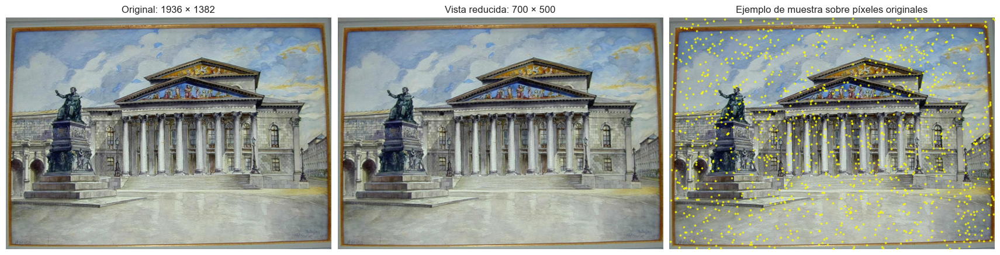

,representación,píxeles
0,original,2675552
1,reducida,350000
2,muestra visual,1200


In [23]:
reducida = reducir_para_diagnostico(imagen.rgb, max_lado=700)
indices_vista = muestrear_indices(imagen.rgb.shape[0] * imagen.rgb.shape[1], 1_200)
y, x = np.unravel_index(indices_vista, imagen.rgb.shape[:2])

fig, ejes = plt.subplots(1, 3, figsize=(17, 5), constrained_layout=True)
ejes[0].imshow(imagen.rgb)
ejes[0].set_title(f"Original: {imagen.rgb.shape[1]} × {imagen.rgb.shape[0]}")
ejes[1].imshow(reducida.rgb)
ejes[1].set_title(f"Vista reducida: {reducida.rgb.shape[1]} × {reducida.rgb.shape[0]}")
ejes[2].imshow(imagen.rgb)
ejes[2].scatter(x, y, s=3, c="yellow", alpha=0.65)
ejes[2].set_title("Ejemplo de muestra sobre píxeles originales")
for eje in ejes:
    eje.axis("off")
plt.show()

pd.DataFrame({
    "representación": ["original", "reducida", "muestra visual"],
    "píxeles": [imagen.rgb.shape[0] * imagen.rgb.shape[1], reducida.rgb.shape[0] * reducida.rgb.shape[1], len(indices_vista)],
})

**Decisión:** la imagen original se conserva para reconstruir el resultado. HDBSCAN se entrenará con una muestra reproducible; posteriormente todos los píxeles se asignarán al color representativo más cercano.

## **3. Revisión opcional del ruido**

JPEG, sensores y texturas producen variaciones locales. Un filtro mediano de tamaño `3 × 3` conserva valores existentes mejor que un desenfoque promedio, mientras que el bilateral preserva bordes pero modifica valores y es más costoso. La función permite comparar alternativas; el pipeline dejará `metodo=None` por defecto porque HDBSCAN ya puede marcar observaciones de baja densidad como ruido.

In [21]:
def filtrar_ruido(
    rgb: np.ndarray,
    *,
    metodo: str | None = None,
    tamano_kernel: int = 3,
) -> np.ndarray:
    '''Aplica un filtro opcional y devuelve siempre una nueva matriz RGB.'''
    if metodo is None:
        salida = rgb.copy()
    elif metodo == "mediana":
        if tamano_kernel < 3 or tamano_kernel % 2 == 0:
            raise ValueError("El kernel mediano debe ser impar y al menos 3.")
        salida = cv2.medianBlur(rgb, tamano_kernel)
    elif metodo == "bilateral":
        salida = cv2.bilateralFilter(rgb, d=5, sigmaColor=25, sigmaSpace=25)
    else:
        raise ValueError("metodo debe ser None, 'mediana' o 'bilateral'.")
    salida.setflags(write=False)
    return salida

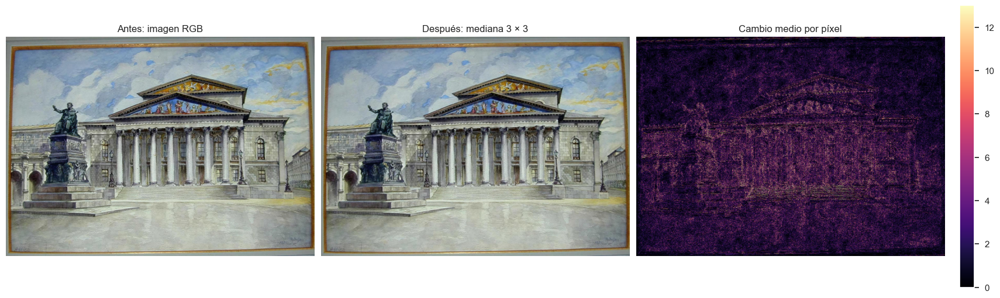

Cambio medio global: 1.850 niveles de 255


In [26]:
imagen_mediana = filtrar_ruido(imagen.rgb, metodo="mediana", tamano_kernel=3)
diferencia = np.abs(imagen.rgb.astype(np.int16) - imagen_mediana.astype(np.int16)).mean(axis=2)
limite = max(1, np.percentile(diferencia, 99))

fig, ejes = plt.subplots(1, 3, figsize=(17, 5), constrained_layout=True)
ejes[0].imshow(imagen.rgb)
ejes[0].set_title("Antes: imagen RGB")
ejes[1].imshow(imagen_mediana)
ejes[1].set_title("Después: mediana 3 × 3")
mapa = ejes[2].imshow(diferencia, cmap="magma", vmin=0, vmax=limite)
ejes[2].set_title("Cambio medio por píxel")
fig.colorbar(mapa, ax=ejes[2], fraction=0.046)
for eje in ejes:
    eje.axis("off")
plt.show()
print(f"Cambio medio global: {diferencia.mean():.3f} niveles de 255")

El mapa de diferencias muestra qué detalles serían eliminados. Para estas obras se conserva la imagen sin filtro como configuración principal; activar el filtro será una decisión explícita, no una transformación oculta.

## **4. Normalización numérica**

OpenCV representa las imágenes habituales como `uint8 [0,255]`. Para conversiones no lineales como RGB → Lab, la documentación recomienda escalar previamente las matrices `float32` a `[0,1]`. La operación no cambia la apariencia: cambia la escala numérica y evita interpretar incorrectamente el rango.

In [22]:
@dataclass(frozen=True)
class ImagenNormalizada:
    rgb: np.ndarray
    mascara_valida: np.ndarray

def normalizar_rgb(rgb: np.ndarray, mascara_valida: np.ndarray) -> ImagenNormalizada:
    '''Convierte RGB uint8 [0,255] a float32 [0,1].'''
    if rgb.dtype != np.uint8:
        raise TypeError(f"Se esperaba uint8; se recibió {rgb.dtype}.")
    normalizada = rgb.astype(np.float32) / 255.0
    normalizada.setflags(write=False)
    return ImagenNormalizada(normalizada, mascara_valida)

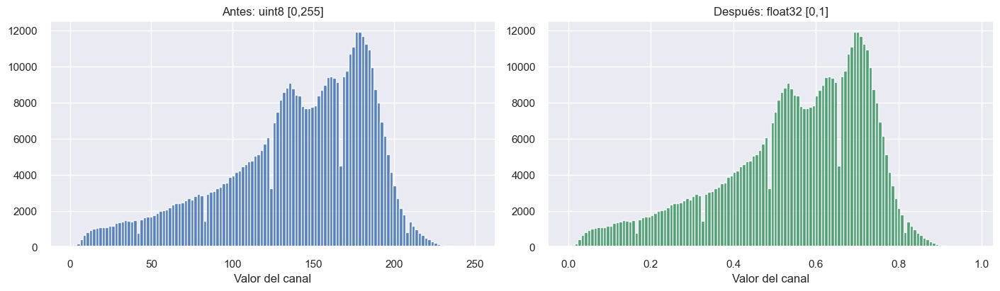

Antes: uint8 0 255
Después: float32 0.0 1.0


In [28]:
normalizada = normalizar_rgb(imagen.rgb, imagen.mascara_valida)
paso = max(1, imagen.rgb.size // 500_000)

fig, ejes = plt.subplots(1, 2, figsize=(14, 4), constrained_layout=True)
ejes[0].hist(imagen.rgb.ravel()[::paso], bins=128, color="#3266b0", alpha=0.8)
ejes[0].set_title("Antes: uint8 [0,255]")
ejes[0].set_xlabel("Valor del canal")
ejes[1].hist(normalizada.rgb.ravel()[::paso], bins=128, color="#2c8b57", alpha=0.8)
ejes[1].set_title("Después: float32 [0,1]")
ejes[1].set_xlabel("Valor del canal")
plt.show()

print("Antes:", imagen.rgb.dtype, imagen.rgb.min(), imagen.rgb.max())
print("Después:", normalizada.rgb.dtype, normalizada.rgb.min(), normalizada.rgb.max())

La forma de la distribución se conserva; únicamente cambia la unidad. No se aplica `StandardScaler` porque alteraría la métrica Lab según la distribución particular de cada imagen.

## **5. Conversión de RGB a CIELAB**

Las distancias euclidianas en RGB no son una buena aproximación uniforme a la diferencia percibida. CIELAB separa luminosidad (`L*`) y cromaticidad (`a*`, `b*`). Con entrada `float32`, OpenCV produce `L*` aproximadamente en `[0,100]` y componentes cromáticas con signo, adecuadas para el modelo basado en distancias.

In [23]:
@dataclass(frozen=True)
class ImagenLab:
    lab: np.ndarray
    mascara_valida: np.ndarray

def convertir_rgb_a_lab(imagen_rgb: ImagenNormalizada) -> ImagenLab:
    '''Convierte RGB float32 [0,1] a CIELAB float32.'''
    lab = cv2.cvtColor(imagen_rgb.rgb, cv2.COLOR_RGB2Lab).astype(np.float32)
    lab.setflags(write=False)
    return ImagenLab(lab, imagen_rgb.mascara_valida)

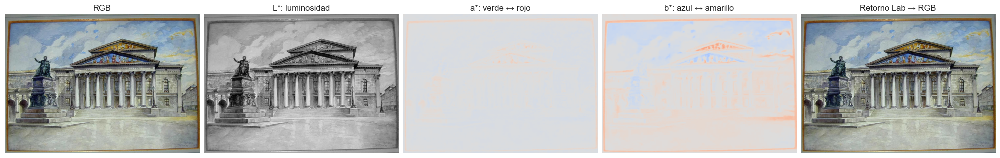

Error máximo del retorno RGB → Lab → RGB: 0.003815


In [30]:
imagen_lab = convertir_rgb_a_lab(normalizada)
reconstruccion = cv2.cvtColor(imagen_lab.lab, cv2.COLOR_Lab2RGB)
error_retorno = np.abs(reconstruccion - normalizada.rgb)

fig, ejes = plt.subplots(1, 5, figsize=(20, 4), constrained_layout=True)
ejes[0].imshow(normalizada.rgb)
ejes[0].set_title("RGB")
ejes[1].imshow(imagen_lab.lab[..., 0], cmap="gray", vmin=0, vmax=100)
ejes[1].set_title("L*: luminosidad")
ejes[2].imshow(imagen_lab.lab[..., 1], cmap="coolwarm", vmin=-128, vmax=127)
ejes[2].set_title("a*: verde ↔ rojo")
ejes[3].imshow(imagen_lab.lab[..., 2], cmap="coolwarm", vmin=-128, vmax=127)
ejes[3].set_title("b*: azul ↔ amarillo")
ejes[4].imshow(np.clip(reconstruccion, 0, 1))
ejes[4].set_title("Retorno Lab → RGB")
for eje in ejes:
    eje.axis("off")
plt.show()
print(f"Error máximo del retorno RGB → Lab → RGB: {error_retorno.max():.6f}")

La reconstrucción confirma que Lab conserva la información visual dentro de la precisión numérica. Los mapas `a*` y `b*` muestran que la representación entregada al modelo separa la cromaticidad de la iluminación.

## **6. Vectorización, peso de luminosidad y muestreo**

La matriz `alto × ancho × 3` se transforma en `N × 3`, donde cada fila representa un píxel Lab. Se reduce el peso de `L*` a `0.65`: así las sombras cuentan, pero no separan automáticamente un mismo tono en tantos grupos. El valor queda expuesto como parámetro para estudiar otros objetivos.

Se toman como máximo 12 000 píxeles sin reemplazo y con semilla fija. Los colores originales de la muestra se conservan para interpretar los gráficos.

In [24]:
@dataclass(frozen=True)
class CaracteristicasColor:
    completas: np.ndarray
    muestra: np.ndarray
    muestra_rgb: np.ndarray
    indices_muestra: np.ndarray
    forma_imagen: tuple[int, int]
    peso_l: float

def preparar_caracteristicas(
    imagen_rgb: ImagenNormalizada,
    imagen_lab: ImagenLab,
    *,
    n_muestras: int = 12_000,
    peso_l: float = 0.65,
    random_state: int = 42,
) -> CaracteristicasColor:
    '''Vectoriza Lab, pondera L* y crea una muestra reproducible.'''
    if not (0 < peso_l <= 1):
        raise ValueError("peso_l debe pertenecer a (0,1].")
    mascara = imagen_lab.mascara_valida.reshape(-1)
    lab = imagen_lab.lab.reshape(-1, 3)[mascara].copy()
    rgb = imagen_rgb.rgb.reshape(-1, 3)[mascara]
    caracteristicas = lab.copy()
    caracteristicas[:, 0] *= peso_l
    indices = muestrear_indices(len(caracteristicas), n_muestras, random_state)

    muestra = caracteristicas[indices].copy()
    muestra_rgb = rgb[indices].copy()
    for arreglo in (caracteristicas, muestra, muestra_rgb, indices):
        arreglo.setflags(write=False)
    return CaracteristicasColor(
        caracteristicas,
        muestra,
        muestra_rgb,
        indices,
        imagen_lab.lab.shape[:2],
        peso_l,
    )

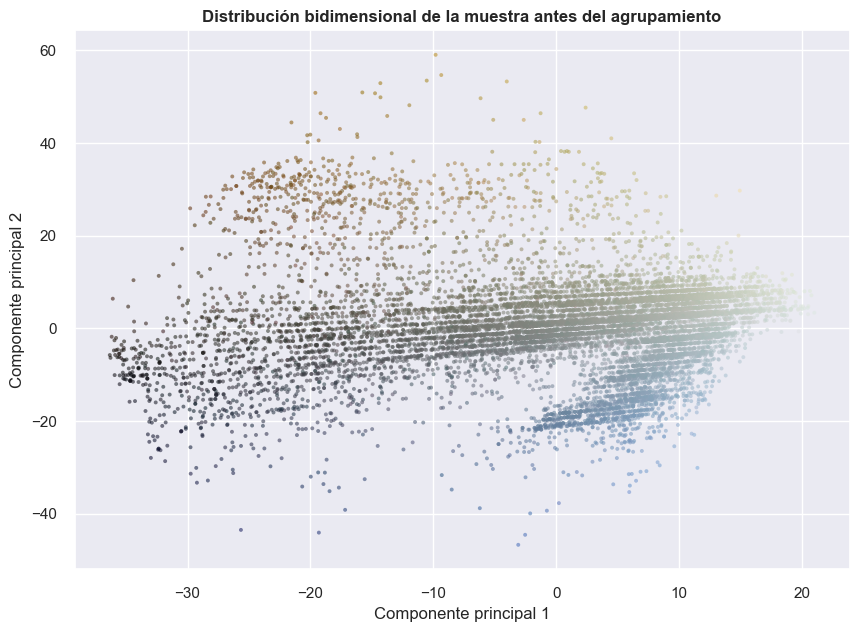

Matriz completa: (2675552, 3)
Muestra del modelo: (12000, 3)


In [32]:
caracteristicas = preparar_caracteristicas(normalizada, imagen_lab)
proyeccion_inicial = PCA(n_components=2, random_state=42).fit_transform(caracteristicas.muestra)

fig, eje = plt.subplots(figsize=(10, 7))
eje.scatter(
    proyeccion_inicial[:, 0],
    proyeccion_inicial[:, 1],
    c=caracteristicas.muestra_rgb,
    s=8,
    alpha=0.55,
    linewidths=0,
)
eje.set_title("Distribución bidimensional de la muestra antes del agrupamiento", fontweight="bold")
eje.set_xlabel("Componente principal 1")
eje.set_ylabel("Componente principal 2")
plt.show()
print("Matriz completa:", caracteristicas.completas.shape)
print("Muestra del modelo:", caracteristicas.muestra.shape)

PCA se usa únicamente para visualización; HDBSCAN recibe directamente las tres características ponderadas. Por tanto, la reducción bidimensional no elimina información durante el agrupamiento.

### **Creación del modelo**

## **HDBSCAN**

HDBSCAN ejecuta una jerarquía de agrupamientos basados en densidad y selecciona regiones estables. No requiere indicar el número de colores. `min_cluster_size` define la presencia mínima que debe tener un color para convertirse en grupo, mientras que `min_samples` controla cuán conservador es el tratamiento del ruido.

En lugar de fijar `min_cluster_size` como número absoluto se expresa como fracción de la muestra. Con `0.008`, un grupo necesita aproximadamente el `0.8 %` de los píxeles muestreados. Se usa `cluster_selection_method="leaf"` para identificar modos cromáticos finos y se solicitan medoides para que cada color representativo corresponda a un punto real. En la etapa siguiente se fusionarán medoides separados por menos de `8 ΔE76`, evitando duplicados casi idénticos sin fijar una cantidad de colores.

Referencia: [HDBSCAN en scikit-learn](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.HDBSCAN.html).

In [25]:
@dataclass(frozen=True)
class ResultadoHDBSCAN:
    modelo: HDBSCAN
    etiquetas_muestra: np.ndarray
    centros_caracteristicas: np.ndarray
    centros_lab: np.ndarray
    numero_grupos: int
    fraccion_ruido: float
    silhouette: float
    min_cluster_size: int

def agrupar_hdbscan(
    datos: CaracteristicasColor,
    *,
    min_cluster_fraction: float = 0.008,
    min_samples: int = 10,
) -> ResultadoHDBSCAN:
    '''Ajusta HDBSCAN y recupera medoides en el espacio Lab original.'''
    if not (0 < min_cluster_fraction < 1):
        raise ValueError("min_cluster_fraction debe pertenecer a (0,1).")
    minimo = max(20, int(np.ceil(len(datos.muestra) * min_cluster_fraction)))
    modelo = HDBSCAN(
        min_cluster_size=minimo,
        min_samples=min_samples,
        metric="euclidean",
        cluster_selection_method="leaf",
        store_centers="medoid",
        n_jobs=1,
        copy=True,
    )
    etiquetas = modelo.fit_predict(datos.muestra)
    grupos = sorted(set(etiquetas) - {-1})
    if not grupos:
        raise RuntimeError("HDBSCAN no encontró grupos; revise la fracción mínima.")

    centros_caracteristicas = modelo.medoids_.astype(np.float32)
    centros_lab = centros_caracteristicas.copy()
    centros_lab[:, 0] /= datos.peso_l
    validos = etiquetas >= 0
    silhouette = np.nan
    if len(grupos) > 1 and validos.sum() > len(grupos):
        silhouette = silhouette_score(datos.muestra[validos], etiquetas[validos])

    for arreglo in (etiquetas, centros_caracteristicas, centros_lab):
        arreglo.setflags(write=False)
    return ResultadoHDBSCAN(
        modelo,
        etiquetas,
        centros_caracteristicas,
        centros_lab,
        len(grupos),
        float((etiquetas == -1).mean()),
        float(silhouette),
        minimo,
    )

def fusionar_centros_lab(
    centros_lab: np.ndarray,
    conteos: np.ndarray,
    umbral_delta_e: float = 8.0,
) -> tuple[np.ndarray, np.ndarray]:
    '''Fusiona medoides cercanos y devuelve representantes y mapa de fusión.'''
    if umbral_delta_e <= 0:
        raise ValueError("umbral_delta_e debe ser positivo.")
    representantes: list[int] = []
    mapa = np.empty(len(centros_lab), dtype=np.int32)
    for indice in np.argsort(conteos)[::-1]:
        if not representantes:
            representantes.append(int(indice))
            mapa[indice] = 0
            continue
        distancias = np.linalg.norm(centros_lab[representantes] - centros_lab[indice], axis=1)
        cercano = int(np.argmin(distancias))
        if distancias[cercano] <= umbral_delta_e:
            mapa[indice] = cercano
        else:
            representantes.append(int(indice))
            mapa[indice] = len(representantes) - 1
    return np.asarray(representantes, dtype=np.int32), mapa

def evaluar_sensibilidad_hdbscan(
    datos: CaracteristicasColor,
    fracciones=(0.004, 0.006, 0.008, 0.012, 0.02),
    min_samples: int = 10,
) -> pd.DataFrame:
    '''Compara el efecto del tamaño mínimo sin seleccionar un número K.'''
    filas = []
    for fraccion in fracciones:
        try:
            resultado = agrupar_hdbscan(
                datos,
                min_cluster_fraction=fraccion,
                min_samples=min_samples,
            )
            validas = resultado.etiquetas_muestra[resultado.etiquetas_muestra >= 0]
            conteos = np.bincount(validas, minlength=resultado.numero_grupos)
            representantes, _ = fusionar_centros_lab(
                resultado.centros_lab,
                conteos,
                umbral_delta_e=8.0,
            )
            filas.append({
                "fracción mínima": fraccion,
                "min_cluster_size": resultado.min_cluster_size,
                "grupos HDBSCAN": resultado.numero_grupos,
                "colores tras fusión": len(representantes),
                "ruido": resultado.fraccion_ruido,
                "silhouette sin ruido": resultado.silhouette,
            })
        except RuntimeError:
            filas.append({
                "fracción mínima": fraccion,
                "min_cluster_size": int(np.ceil(len(datos.muestra) * fraccion)),
                "grupos HDBSCAN": 0,
                "colores tras fusión": 0,
                "ruido": 1.0,
                "silhouette sin ruido": np.nan,
            })
    return pd.DataFrame(filas)

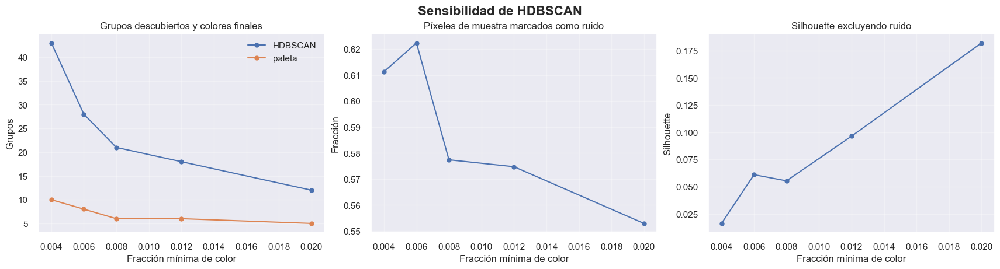

,fracción mínima,min_cluster_size,grupos HDBSCAN,colores tras fusión,ruido,silhouette sin ruido
0,0.004,48,43,10,0.6113,0.0162
1,0.006,72,28,8,0.6224,0.0610
2,0.008,96,21,6,0.5774,0.0554
3,0.012,144,18,6,0.5748,0.0964
4,0.020,240,12,5,0.5529,0.1821


In [34]:
sensibilidad = evaluar_sensibilidad_hdbscan(caracteristicas)

fig, ejes = plt.subplots(1, 3, figsize=(17, 4.5), constrained_layout=True)
ejes[0].plot(sensibilidad["fracción mínima"], sensibilidad["grupos HDBSCAN"], marker="o", label="HDBSCAN")
ejes[0].plot(sensibilidad["fracción mínima"], sensibilidad["colores tras fusión"], marker="o", label="paleta")
ejes[0].set_title("Grupos descubiertos y colores finales")
ejes[0].set_ylabel("Grupos")
ejes[0].legend()
ejes[1].plot(sensibilidad["fracción mínima"], sensibilidad["ruido"], marker="o")
ejes[1].set_title("Píxeles de muestra marcados como ruido")
ejes[1].set_ylabel("Fracción")
ejes[2].plot(sensibilidad["fracción mínima"], sensibilidad["silhouette sin ruido"], marker="o")
ejes[2].set_title("Silhouette excluyendo ruido")
ejes[2].set_ylabel("Silhouette")
for eje in ejes:
    eje.set_xlabel("Fracción mínima de color")
    eje.grid(alpha=0.3)
fig.suptitle("Sensibilidad de HDBSCAN", fontsize=16, fontweight="bold")
plt.show()
sensibilidad.round(4)

La sensibilidad no se utiliza para escoger un número de grupos: permite comprobar si la paleta fusionada es estable ante cambios razonables en la presencia mínima exigida. La configuración principal `0.008` mantiene modos con presencia suficiente y deja las variaciones aisladas como ruido.

## **7. Construcción de la paleta y reconstrucción**

Los medoides encontrados en la muestra forman los colores candidatos. Los candidatos separados por menos de `8 ΔE76` se fusionan, conservando como representante el medoide más frecuente. Para reconstruir toda la imagen, cada píxel completo se asigna al medoide HDBSCAN más cercano por bloques y luego al color fusionado correspondiente. Después se ordenan los colores por porcentaje y se convierten Lab → RGB con OpenCV.

Los puntos que HDBSCAN consideró ruido durante el ajuste no desaparecen: en la reconstrucción se asignan al color representativo más próximo. La fracción de ruido sigue reportándose para auditar cuánto simplificó el modelo.

In [35]:
@dataclass(frozen=True)
class ResultadoPaleta:
    imagen_segmentada: np.ndarray
    paleta_rgb: np.ndarray
    porcentajes: np.ndarray
    codigos_hex: tuple[str, ...]
    etiquetas_completas: np.ndarray
    mapa_cluster_a_paleta: Mapping[int, int]

def construir_paleta(
    datos: CaracteristicasColor,
    agrupamiento: ResultadoHDBSCAN,
    *,
    tamano_bloque: int = 250_000,
    umbral_fusion_delta_e: float = 8.0,
) -> ResultadoPaleta:
    '''Asigna todos los píxeles a medoides y reconstruye la imagen RGB.'''
    etiquetas = np.empty(len(datos.completas), dtype=np.int32)
    for inicio in range(0, len(datos.completas), tamano_bloque):
        fin = min(len(datos.completas), inicio + tamano_bloque)
        etiquetas[inicio:fin] = pairwise_distances_argmin(
            datos.completas[inicio:fin],
            agrupamiento.centros_caracteristicas,
        )

    etiquetas_muestra_validas = agrupamiento.etiquetas_muestra[
        agrupamiento.etiquetas_muestra >= 0
    ]
    conteos_muestra = np.bincount(
        etiquetas_muestra_validas,
        minlength=agrupamiento.numero_grupos,
    )
    representantes, mapa_fusion = fusionar_centros_lab(
        agrupamiento.centros_lab,
        conteos_muestra,
        umbral_delta_e=umbral_fusion_delta_e,
    )
    etiquetas_fusionadas = mapa_fusion[etiquetas]
    conteos = np.bincount(etiquetas_fusionadas, minlength=len(representantes))
    orden = np.argsort(conteos)[::-1]
    inversa = np.empty_like(orden)
    inversa[orden] = np.arange(len(orden))
    etiquetas_ordenadas = inversa[etiquetas_fusionadas]
    centros_lab = agrupamiento.centros_lab[representantes][orden].astype(np.float32)
    porcentajes = conteos[orden] / conteos.sum()

    paleta_float = cv2.cvtColor(centros_lab.reshape(1, -1, 3), cv2.COLOR_Lab2RGB)[0]
    paleta_rgb = np.rint(np.clip(paleta_float, 0, 1) * 255).astype(np.uint8)
    segmentada_lab = centros_lab[etiquetas_ordenadas].reshape(*datos.forma_imagen, 3)
    segmentada_float = cv2.cvtColor(segmentada_lab, cv2.COLOR_Lab2RGB)
    segmentada = np.rint(np.clip(segmentada_float, 0, 1) * 255).astype(np.uint8)
    hexes = tuple("#" + "".join(f"{canal:02X}" for canal in color) for color in paleta_rgb)
    mapa = MappingProxyType({
        int(cluster): int(inversa[mapa_fusion[cluster]])
        for cluster in range(agrupamiento.numero_grupos)
    })

    for arreglo in (segmentada, paleta_rgb, porcentajes, etiquetas_ordenadas):
        arreglo.setflags(write=False)
    return ResultadoPaleta(segmentada, paleta_rgb, porcentajes, hexes, etiquetas_ordenadas, mapa)

def visualizar_resultado(
    original_rgb: np.ndarray,
    paleta: ResultadoPaleta,
    agrupamiento: ResultadoHDBSCAN,
    titulo: str,
) -> None:
    '''Presenta original, segmentación, paleta y resumen del modelo.'''
    fig = plt.figure(figsize=(16, 8))
    rejilla = fig.add_gridspec(2, 2, height_ratios=[5, 1.4], hspace=0.23)
    ejes = [fig.add_subplot(rejilla[0, 0]), fig.add_subplot(rejilla[0, 1])]
    ejes[0].imshow(original_rgb)
    ejes[0].set_title("Imagen original", fontweight="bold")
    ejes[1].imshow(paleta.imagen_segmentada)
    ejes[1].set_title(f"Imagen agrupada — {len(paleta.paleta_rgb)} colores", fontweight="bold")
    for eje in ejes:
        eje.axis("off")

    eje_paleta = fig.add_subplot(rejilla[1, :])
    inicio = 0.0
    for color, porcentaje, codigo in zip(paleta.paleta_rgb, paleta.porcentajes, paleta.codigos_hex):
        rgb = color / 255.0
        eje_paleta.barh(0, porcentaje, left=inicio, height=0.72, color=rgb)
        luminancia = 0.2126 * rgb[0] + 0.7152 * rgb[1] + 0.0722 * rgb[2]
        if porcentaje >= 0.045:
            eje_paleta.text(
                inicio + porcentaje / 2,
                0,
                f"{codigo}\n{porcentaje:.1%}",
                ha="center",
                va="center",
                color="black" if luminancia > 0.58 else "white",
                fontsize=9,
                fontweight="bold",
            )
        inicio += porcentaje
    eje_paleta.set_xlim(0, 1)
    eje_paleta.set_yticks([])
    eje_paleta.set_xlabel("Proporción de píxeles asignados")
    eje_paleta.set_title("Paleta ordenada por presencia", fontweight="bold")

    resumen = (
        f"Modelo: HDBSCAN   |   grupos densos: {agrupamiento.numero_grupos}   |   "
        f"colores fusionados: {len(paleta.paleta_rgb)}   |   "
        f"ruido en muestra: {agrupamiento.fraccion_ruido:.1%}   |   "
        f"silhouette sin ruido: {agrupamiento.silhouette:.3f}   |   "
        f"píxeles: {original_rgb.shape[0] * original_rgb.shape[1]:,}"
    )
    fig.suptitle(titulo, fontsize=17, fontweight="bold")
    fig.text(0.5, 0.01, resumen, ha="center", fontsize=10)
    plt.show()

def visualizar_pca_agrupada(
    datos: CaracteristicasColor,
    agrupamiento: ResultadoHDBSCAN,
    paleta: ResultadoPaleta,
) -> None:
    '''Proyecta la muestra a dos dimensiones y distingue grupos y ruido.'''
    proyeccion = PCA(n_components=2, random_state=42).fit_transform(datos.muestra)
    fig, eje = plt.subplots(figsize=(10, 7))
    ruido = agrupamiento.etiquetas_muestra == -1
    eje.scatter(proyeccion[ruido, 0], proyeccion[ruido, 1], c="lightgray", s=8, alpha=0.3, label="ruido")
    for indice_paleta in range(len(paleta.paleta_rgb)):
        clusters_origen = [
            cluster
            for cluster, destino in paleta.mapa_cluster_a_paleta.items()
            if destino == indice_paleta
        ]
        mascara = np.isin(
            agrupamiento.etiquetas_muestra,
            clusters_origen,
        )
        color = paleta.paleta_rgb[indice_paleta] / 255.0
        eje.scatter(
            proyeccion[mascara, 0],
            proyeccion[mascara, 1],
            color=[color],
            s=10,
            alpha=0.55,
            label=f"grupo {indice_paleta + 1}",
        )
    eje.set_title("PCA de la muestra agrupada", fontweight="bold")
    eje.set_xlabel("Componente principal 1")
    eje.set_ylabel("Componente principal 2")
    eje.legend(ncol=2, fontsize=8)
    plt.show()

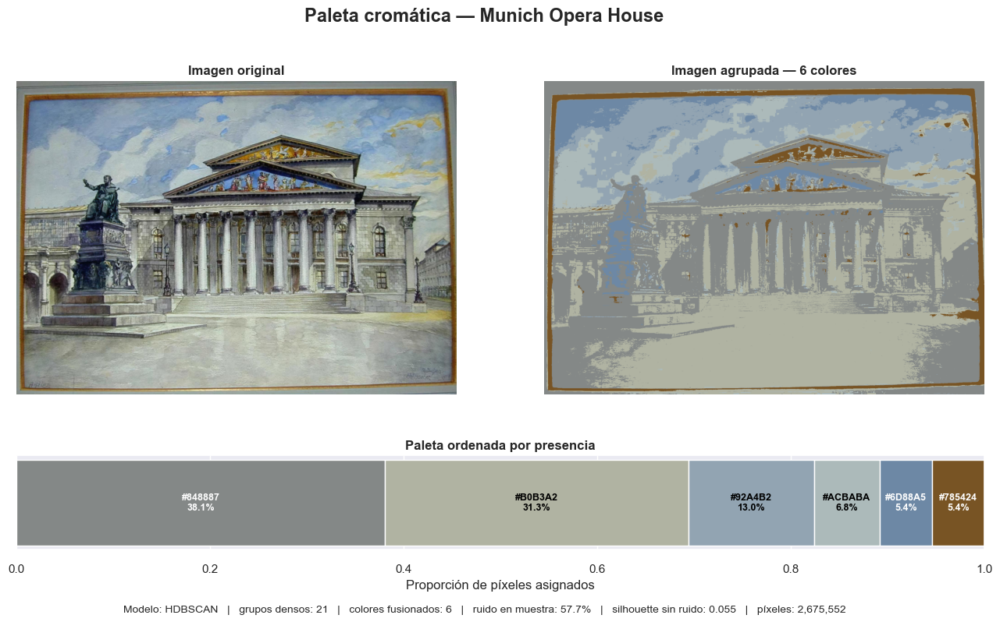

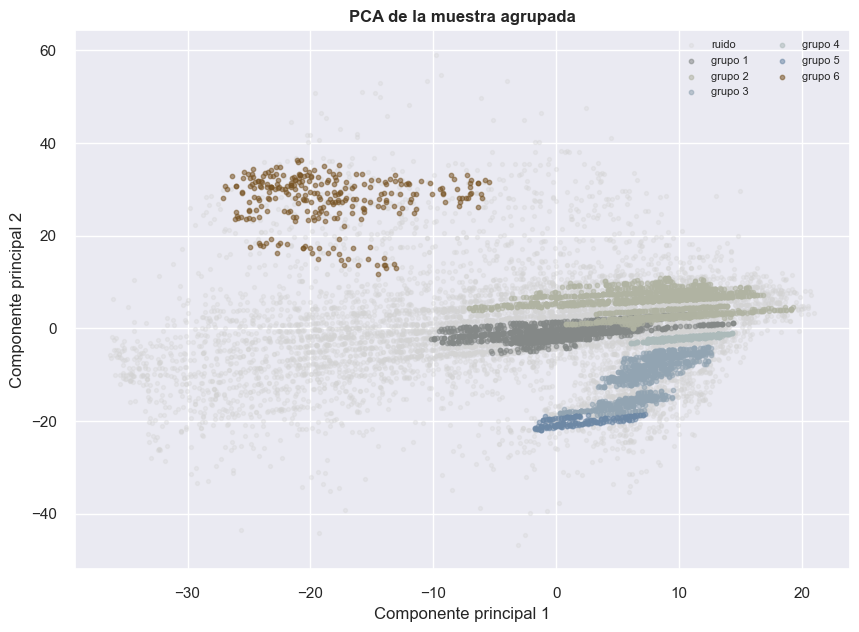

,color,porcentaje
0,#848887,38.13%
1,#B0B3A2,31.31%
2,#92A4B2,12.99%
3,#ACBABA,6.76%
4,#6D88A5,5.44%
5,#785424,5.36%


In [36]:
agrupamiento = agrupar_hdbscan(caracteristicas, min_cluster_fraction=0.008, min_samples=10)
resultado_paleta = construir_paleta(caracteristicas, agrupamiento)

visualizar_resultado(
    imagen.rgb,
    resultado_paleta,
    agrupamiento,
    "Paleta cromática — Munich Opera House",
)
visualizar_pca_agrupada(caracteristicas, agrupamiento, resultado_paleta)

tabla_paleta = pd.DataFrame({
    "color": resultado_paleta.codigos_hex,
    "porcentaje": resultado_paleta.porcentajes,
})
tabla_paleta["porcentaje"] = tabla_paleta["porcentaje"].map(lambda valor: f"{valor:.2%}")
tabla_paleta

## **8. Pipeline reutilizable**

La clase siguiente no vuelve a implementar las transformaciones: coordina las funciones ya verificadas. Esta composición permite sustituir una etapa —por ejemplo el filtro o el peso de luminosidad— sin modificar el resto del flujo.

In [37]:
class PaletaHDBSCANPipeline:
    '''Pipeline componible para obtener una paleta cromática con HDBSCAN.'''

    def __init__(
        self,
        ruta: str | Path,
        *,
        n_muestras: int = 12_000,
        peso_l: float = 0.65,
        min_cluster_fraction: float = 0.008,
        min_samples: int = 10,
        umbral_fusion_delta_e: float = 8.0,
        filtro: str | None = None,
        random_state: int = 42,
    ):
        self.ruta = Path(ruta)
        self.n_muestras = n_muestras
        self.peso_l = peso_l
        self.min_cluster_fraction = min_cluster_fraction
        self.min_samples = min_samples
        self.umbral_fusion_delta_e = umbral_fusion_delta_e
        self.filtro = filtro
        self.random_state = random_state
        self.imagen = None
        self.normalizada = None
        self.lab = None
        self.caracteristicas = None
        self.agrupamiento = None
        self.paleta = None

    def ejecutar(self, *, visualizar: bool = True, visualizar_pca: bool = False):
        self.imagen = estandarizar_imagen(self.ruta)
        rgb_trabajo = filtrar_ruido(self.imagen.rgb, metodo=self.filtro)
        self.normalizada = normalizar_rgb(rgb_trabajo, self.imagen.mascara_valida)
        self.lab = convertir_rgb_a_lab(self.normalizada)
        self.caracteristicas = preparar_caracteristicas(
            self.normalizada,
            self.lab,
            n_muestras=self.n_muestras,
            peso_l=self.peso_l,
            random_state=self.random_state,
        )
        self.agrupamiento = agrupar_hdbscan(
            self.caracteristicas,
            min_cluster_fraction=self.min_cluster_fraction,
            min_samples=self.min_samples,
        )
        self.paleta = construir_paleta(
            self.caracteristicas,
            self.agrupamiento,
            umbral_fusion_delta_e=self.umbral_fusion_delta_e,
        )

        if visualizar:
            visualizar_resultado(
                self.imagen.rgb,
                self.paleta,
                self.agrupamiento,
                f"Paleta cromática — {self.ruta.stem}",
            )
        if visualizar_pca:
            visualizar_pca_agrupada(self.caracteristicas, self.agrupamiento, self.paleta)
        self.imprimir_resumen()
        return self.paleta

    def imprimir_resumen(self) -> None:
        print("\n" + "=" * 62)
        print("RESUMEN DEL PIPELINE DE PALETA")
        print("=" * 62)
        print(f"Archivo                : {self.ruta.name}")
        print(f"Modelo                 : HDBSCAN")
        print(f"Grupos descubiertos    : {self.agrupamiento.numero_grupos}")
        print(f"Colores tras fusión    : {len(self.paleta.paleta_rgb)}")
        print(f"Ruido en la muestra    : {self.agrupamiento.fraccion_ruido:.2%}")
        print(f"Silhouette sin ruido   : {self.agrupamiento.silhouette:.4f}")
        print(f"Muestra                : {len(self.caracteristicas.muestra):,} píxeles")
        print(f"Imagen completa        : {len(self.caracteristicas.completas):,} píxeles")
        print("Colores                :", ", ".join(self.paleta.codigos_hex))
        print("=" * 62)

### **Aplicación del pipeline a otras imágenes**

Se utilizan los mismos parámetros para obras con paletas y estilos diferentes. El número final de colores puede cambiar porque es una propiedad encontrada en los datos, no una entrada fijada por el usuario.

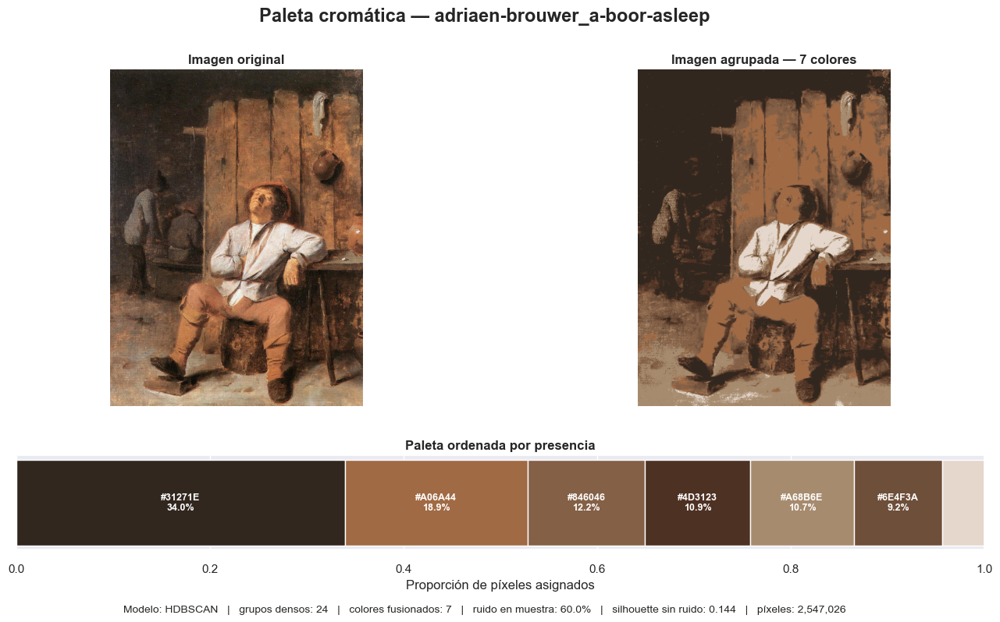


RESUMEN DEL PIPELINE DE PALETA
Archivo                : adriaen-brouwer_a-boor-asleep.jpg
Modelo                 : HDBSCAN
Grupos descubiertos    : 24
Colores tras fusión    : 7
Ruido en la muestra    : 60.01%
Silhouette sin ruido   : 0.1440
Muestra                : 10,000 píxeles
Imagen completa        : 2,547,026 píxeles
Colores                : #31271E, #A06A44, #846046, #4D3123, #A68B6E, #6E4F3A, #E5D7CC


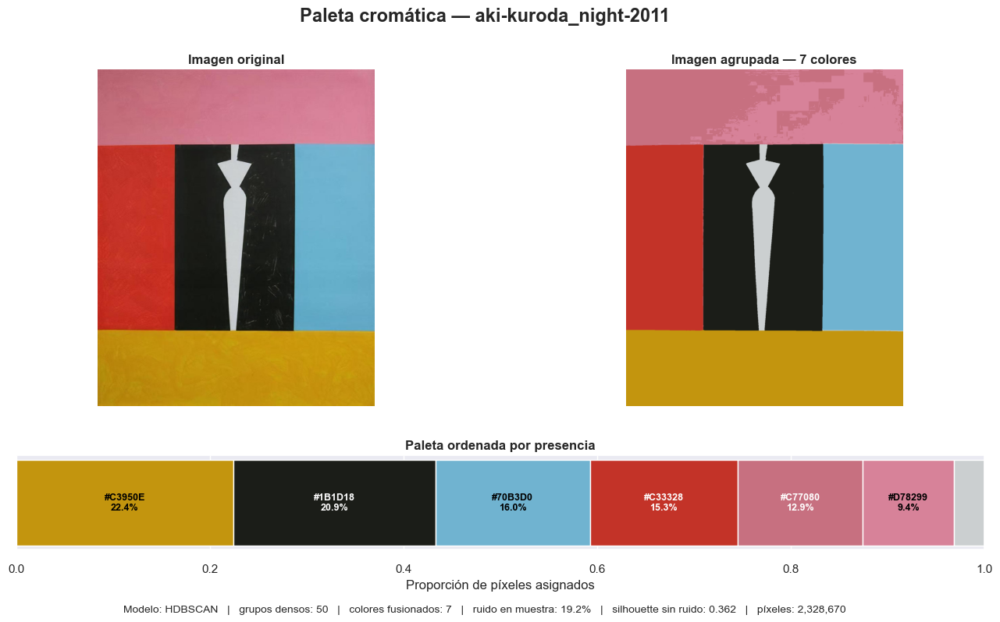


RESUMEN DEL PIPELINE DE PALETA
Archivo                : aki-kuroda_night-2011.jpg
Modelo                 : HDBSCAN
Grupos descubiertos    : 50
Colores tras fusión    : 7
Ruido en la muestra    : 19.17%
Silhouette sin ruido   : 0.3620
Muestra                : 10,000 píxeles
Imagen completa        : 2,328,670 píxeles
Colores                : #C3950E, #1B1D18, #70B3D0, #C33328, #C77080, #D78299, #CBCFD0


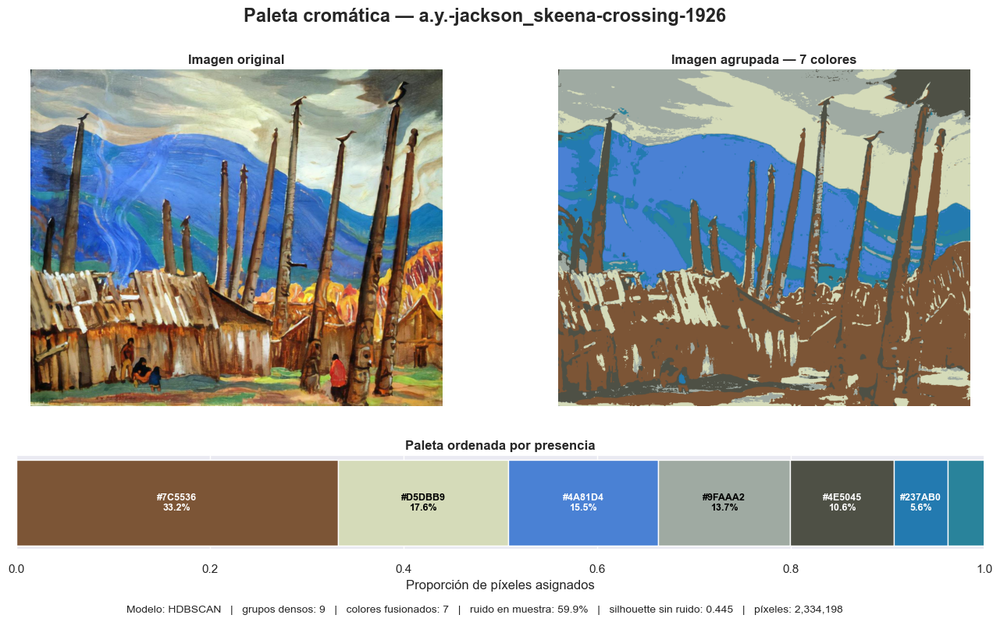


RESUMEN DEL PIPELINE DE PALETA
Archivo                : a.y.-jackson_skeena-crossing-1926.jpg
Modelo                 : HDBSCAN
Grupos descubiertos    : 9
Colores tras fusión    : 7
Ruido en la muestra    : 59.91%
Silhouette sin ruido   : 0.4453
Muestra                : 10,000 píxeles
Imagen completa        : 2,334,198 píxeles
Colores                : #7C5536, #D5DBB9, #4A81D4, #9FAAA2, #4E5045, #237AB0, #29839B


,imagen,grupos HDBSCAN,colores finales,ruido,silhouette,colores
0,adriaen-brouwer_a-boor-asleep.jpg,24,7,60.01%,0.1440,"#31271E, #A06A44, #846046, #4D3123, #A68B6E, #..."
1,aki-kuroda_night-2011.jpg,50,7,19.17%,0.3620,"#C3950E, #1B1D18, #70B3D0, #C33328, #C77080, #..."
2,a.y.-jackson_skeena-crossing-1926.jpg,9,7,59.91%,0.4453,"#7C5536, #D5DBB9, #4A81D4, #9FAAA2, #4E5045, #..."


In [38]:
ejemplos = [
    "adriaen-brouwer_a-boor-asleep.jpg",
    "aki-kuroda_night-2011.jpg",
    "a.y.-jackson_skeena-crossing-1926.jpg",
]

resumen_ejemplos = []
for archivo in ejemplos:
    pipeline = PaletaHDBSCANPipeline(
        RUTA_DATOS / archivo,
        n_muestras=10_000,
        peso_l=0.65,
        min_cluster_fraction=0.008,
        min_samples=10,
    )
    paleta_ejemplo = pipeline.ejecutar(visualizar=True)
    resumen_ejemplos.append({
        "imagen": archivo,
        "grupos HDBSCAN": pipeline.agrupamiento.numero_grupos,
        "colores finales": len(paleta_ejemplo.paleta_rgb),
        "ruido": pipeline.agrupamiento.fraccion_ruido,
        "silhouette": pipeline.agrupamiento.silhouette,
        "colores": ", ".join(paleta_ejemplo.codigos_hex),
    })
    del pipeline

tabla_resumen = pd.DataFrame(resumen_ejemplos)
tabla_resumen["ruido"] = tabla_resumen["ruido"].map(lambda valor: f"{valor:.2%}")
tabla_resumen["silhouette"] = tabla_resumen["silhouette"].map(lambda valor: f"{valor:.4f}")
tabla_resumen

## **KMeans**

KMeans es un algoritmo de agrupamiento basado en centroides. Su objetivo es dividir los píxeles en `K` grupos, minimizando la distancia entre cada píxel y el centroide de su grupo. Cada centroide representa un color dominante y, al reemplazar los píxeles por su centroide más cercano, se obtiene una versión segmentada de la imagen.

A diferencia de HDBSCAN, KMeans requiere definir el número de clusters. En este proyecto ese valor no se fija arbitrariamente: se evalúan varios valores de `K` y se selecciona automáticamente el que obtiene el mayor **Silhouette Score**. Esta métrica identifica la alternativa cuyos grupos son más compactos y están mejor separados.

El pipeline aplica el mismo tratamiento robusto utilizado en HDBSCAN: estandarización de la imagen, normalización, conversión al espacio CIELAB, ponderación de la luminosidad y muestreo reproducible. Así, la comparación se concentra en la diferencia entre los algoritmos y no en usar datos preparados de manera desigual.

KMeans es apropiado cuando se necesita una paleta compacta, controlada, reproducible y fácil de interpretar. Su limitación principal es que no identifica ruido de forma nativa: todos los píxeles deben pertenecer a alguno de los `K` grupos.

Referencia: [KMeans en scikit-learn](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).


In [2]:
# Funcion para extraer los datos desde un orgigen Data/.csv
def load_images(root_path, file_names, flatten=True, normalize=True):
    """
    Retorna una lista con arreglos de números. Cada arreglo representa una imagen RGB.
    
    Parametros:
    root_path : str
        Directorio raíz de las imágenes.
    file_names : list
        Lista con los nombres de los archivos de imágenes.
    flatten : bool, opcional
        Si es True, aplana las imágenes a una lista de píxeles de tres dimensiones.
    normalize : bool, opcional
        Si es True, normaliza los valores de píxeles al rango [0, 1].
    """
    image_list = list()
    for file in file_names:
        img = cv2.imread(os.path.join(root_path, file))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if flatten:
            img = img.reshape((-1, 3))
        if normalize:
            img = img / 255.0
        image_list.append(img)
    return image_list

root_path = 'Data'
img_files = os.listdir(root_path)
img_files

['a.y.-jackson_skeena-crossing-1926.jpg',
 'adolf-hitler_the-munich-opera-house.jpg',
 'adriaen-brouwer_a-boor-asleep.jpg',
 'adriaen-brouwer_father-s-of-unpleasant-duties-1631.jpg',
 'adriaen-brouwer_the-bitter-drunk.jpg',
 'aki-kuroda_night-2011.jpg',
 'albert-gleizes_portrait-de-jacques-nayral-1911.jpg',
 'andre-bauchant_le-bouquet-1928.jpg',
 'andrea-del-castagno_crucifixion-1.jpg',
 'andrea-del-castagno_deposition-of-christ.jpg',
 'andrea-del-castagno_queen-esther.jpg',
 'camille-pissarro_haymakers-resting-1891.jpg']

In [36]:
class PaletaKMeansPipeline:
    """Pipeline para extracción de paleta cromática usando K-Means con tratamiento robusto.

    La clase coordina todo el flujo de preparación de la imagen y la selección del número
    de clusters de forma reproducible. Su objetivo es producir una paleta representativa de
    la imagen sin perder el rigor del procesamiento del notebook avanzado.

    Motivo del diseño:
        - garantizar que el modelo trabaje sobre una imagen ya estandarizada y validada,
        - reducir ruido y evitar que pequeñas variaciones locales distorsionen la paleta,
        - representar los colores en CIELAB para una comparación más perceptual,
        - evaluar automáticamente K usando silhouette score,
        - reconstruir la imagen a partir de los centroides finales para comparar el resultado.
    """

    def __init__(
        self,
        ruta: str | Path,
        *,
        k_range=(2, 10),
        n_muestras: int = 12_000,
        peso_l: float = 0.65,
        filtro: str | None = None,
        random_state: int = 42,
    ):
        self.ruta = Path(ruta)
        self.k_range = range(k_range[0], k_range[1] + 1)
        self.n_muestras = n_muestras
        self.peso_l = peso_l
        self.filtro = filtro
        self.random_state = random_state

        self.imagen = None
        self.normalizada = None
        self.lab = None
        self.caracteristicas = None

        self.results = []
        self.inertias = []
        self.silhouettes = []

        self.best_k = None
        self.best_model = None
        self.clustered_img = None
        self.paleta_rgb = None
        self.porcentajes = None
        self.codigos_hex = ()

    def preparar_datos(self):
        """Prepara la imagen para el modelo: valida la entrada, la normaliza, convierte a Lab y genera la muestra de trabajo.

        Esta etapa sirve para crear un conjunto de datos consistente y comparable. Primero se estandariza
        la imagen para que todos los canales sigan el mismo contrato numérico; luego se aplica un posible
        filtro de ruido; después se normaliza a [0,1] y se transforma a CIELAB. Finalmente, se extrae una
        muestra reproducible para evaluar los posibles valores de K sin perder la representación global.
        """
        self.imagen = estandarizar_imagen(self.ruta)
        rgb_trabajo = filtrar_ruido(self.imagen.rgb, metodo=self.filtro)
        self.normalizada = normalizar_rgb(rgb_trabajo, self.imagen.mascara_valida)
        self.lab = convertir_rgb_a_lab(self.normalizada)
        self.caracteristicas = preparar_caracteristicas(
            self.normalizada,
            self.lab,
            n_muestras=self.n_muestras,
            peso_l=self.peso_l,
            random_state=self.random_state,
        )
        return self.caracteristicas

    def evaluar_k(self):
        """Evalúa distintos valores de K y selecciona el que maximiza la separación visual mediante silhouette score.

        Esta función sirve para automatizar la elección del número de clusters sin fijarlo manualmente.
        Para cada valor posible de K, se entrena un KMeans sobre la muestra y se calcula la métrica de
        silueta. El mejor valor de K es el que produce grupos más compactos y bien separados.
        """
        self.results = []
        self.inertias = []
        self.silhouettes = []

        for k in self.k_range:
            modelo = KMeans(
                n_clusters=k,
                max_iter=300,
                n_init=10,
                random_state=self.random_state,
            )
            etiquetas = modelo.fit_predict(self.caracteristicas.muestra)
            if len(np.unique(etiquetas)) < 2:
                continue

            inertia = modelo.inertia_
            silhouette = silhouette_score(self.caracteristicas.muestra, etiquetas)

            self.inertias.append(inertia)
            self.silhouettes.append(silhouette)
            self.results.append({
                "k": k,
                "model": modelo,
                "inertia": inertia,
                "silhouette": silhouette,
            })

        if not self.results:
            raise ValueError("No fue posible evaluar K con los valores definidos en k_range.")

        self.best_k = self.results[np.argmax([r["silhouette"] for r in self.results])]["k"]
        return self.results

    def fit_final_model(self):
        """Entrena el modelo final con el K elegido sobre todos los píxeles válidos.

        La etapa final sirve para ajustar KMeans con la misma cantidad de clusters seleccionada en la
        muestra, pero aplicándola sobre la imagen completa. Así se obtiene una segmentación coherente
        del conjunto total de píxeles en lugar de solo sobre la muestra de validación.
        """
        if self.best_k is None:
            raise ValueError("Primero debe seleccionarse el mejor K.")

        self.best_model = KMeans(
            n_clusters=self.best_k,
            max_iter=300,
            n_init=10,
            random_state=self.random_state,
        )
        self.best_model.fit(self.caracteristicas.completas)
        return self.best_model

    def segment_image(self):
        """Reconstruye la imagen segmentada usando los centroides del modelo y devuelve la paleta final.

        Esta función sirve para llevar la solución del espacio de características al espacio visual.
        Cada píxel se asigna al centroide más cercano y se reconfigura la imagen con esos tonos, de
        manera que se pueda observar la agrupación cromática resultado del modelo.
        """
        if self.best_model is None:
            raise ValueError("Primero debes entrenar el modelo final.")

        labels = self.best_model.predict(self.caracteristicas.completas)
        centros_lab = self.best_model.cluster_centers_.copy()
        centros_lab[:, 0] /= self.peso_l

        conteos = np.bincount(labels, minlength=self.best_k)
        orden = np.argsort(conteos)[::-1]
        centros_lab_ordenados = centros_lab[orden]

        lab_reshape = centros_lab_ordenados[labels].reshape(
            self.imagen.rgb.shape[0],
            self.imagen.rgb.shape[1],
            3,
        )
        segmentada_float = cv2.cvtColor(lab_reshape.astype(np.float32), cv2.COLOR_Lab2RGB)
        self.clustered_img = np.rint(np.clip(segmentada_float, 0, 1) * 255).astype(np.uint8)

        porcentajes = conteos[orden] / conteos.sum()
        paleta_float = cv2.cvtColor(centros_lab_ordenados.reshape(1, -1, 3), cv2.COLOR_Lab2RGB)[0]
        self.paleta_rgb = np.rint(np.clip(paleta_float, 0, 1) * 255).astype(np.uint8)
        self.porcentajes = porcentajes
        self.codigos_hex = tuple("#" + "".join(f"{canal:02X}" for canal in color) for color in self.paleta_rgb)

        return self.clustered_img

    def plot_metrics(self):
        """Grafica la evaluación de K para apoyar la decisión del número de clusters.

        Esta función sirve para visualizar la estabilidad del modelo mediante dos métricas: inercia
        y silhouette. Ayuda a interpretar si el valor seleccionado de K es razonable y no arbitrario.
        """
        ks = list(self.k_range)
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        axes[0].plot(ks, self.inertias, marker="o", linewidth=2)
        axes[0].set_title("Método del Codo", fontsize=14, fontweight="bold")
        axes[0].set_xlabel("Número de clusters (K)")
        axes[0].set_ylabel("Inercia")
        axes[0].grid(True, alpha=0.3)
        axes[0].set_xticks(ks)

        axes[1].plot(ks, self.silhouettes, marker="o", linewidth=2)
        axes[1].set_title("Silhouette Score", fontsize=14, fontweight="bold")
        axes[1].set_xlabel("Número de clusters (K)")
        axes[1].set_ylabel("Silhouette Score")
        axes[1].grid(True, alpha=0.3)
        axes[1].set_xticks(ks)

        if self.best_k is not None:
            idx = list(self.k_range).index(self.best_k)
            axes[1].scatter(self.best_k, self.silhouettes[idx], s=120, zorder=5)
            axes[1].annotate(
                f"K seleccionado = {self.best_k}",
                (self.best_k, self.silhouettes[idx]),
                xytext=(10, 10),
                textcoords="offset points",
                fontsize=10,
                fontweight="bold",
            )

        fig.suptitle("Evaluación del número óptimo de clusters", fontsize=16, fontweight="bold")
        plt.tight_layout()
        plt.show()

    def visualize_result(self):
        """Muestra la imagen original, la segmentación y la paleta final de forma visual.

        Esta función sirve para comunicar los resultados del modelo de forma clara. Permite comparar
        la imagen original con la versión segmentada y observar la composición cromática que el algoritmo
        decidió como más representativa.
        """
        if self.clustered_img is None:
            raise ValueError("Primero debes segmentar la imagen.")

        fig = plt.figure(figsize=(16, 8))
        rejilla = fig.add_gridspec(2, 2, height_ratios=[5, 1.4], hspace=0.23)
        ejes = [fig.add_subplot(rejilla[0, 0]), fig.add_subplot(rejilla[0, 1])]

        ejes[0].imshow(self.imagen.rgb)
        ejes[0].set_title("Imagen original", fontweight="bold")
        ejes[1].imshow(self.clustered_img)
        ejes[1].set_title(f"Imagen segmentada — K={self.best_k}", fontweight="bold")
        for eje in ejes:
            eje.axis("off")

        eje_paleta = fig.add_subplot(rejilla[1, :])
        inicio = 0.0
        for color, porcentaje, codigo in zip(self.paleta_rgb, self.porcentajes, self.codigos_hex):
            rgb = color / 255.0
            eje_paleta.barh(0, porcentaje, left=inicio, height=0.72, color=rgb)
            luminancia = 0.2126 * rgb[0] + 0.7152 * rgb[1] + 0.0722 * rgb[2]
            if porcentaje >= 0.045:
                eje_paleta.text(
                    inicio + porcentaje / 2,
                    0,
                    f"{codigo}\n{porcentaje:.1%}",
                    ha="center",
                    va="center",
                    color="black" if luminancia > 0.58 else "white",
                    fontsize=9,
                    fontweight="bold",
                )
            inicio += porcentaje

        eje_paleta.set_xlim(0, 1)
        eje_paleta.set_yticks([])
        eje_paleta.set_xlabel("Proporción de píxeles asignados")
        eje_paleta.set_title("Paleta ordenada por presencia", fontweight="bold")

        best_idx = list(self.k_range).index(self.best_k)
        resumen = (
            f"Modelo: KMeans   |   K seleccionado: {self.best_k}   |   "
            f"silhouette: {self.silhouettes[best_idx]:.4f}   |   "
            f"inercia: {self.inertias[best_idx]:.2f}   |   "
            f"píxeles: {self.imagen.rgb.shape[0] * self.imagen.rgb.shape[1]:,}"
        )
        fig.suptitle("Segmentación con K-Means — tratamiento robusto de la imagen", fontsize=17, fontweight="bold")
        fig.text(0.5, 0.01, resumen, ha="center", fontsize=10)
        plt.show()

    def print_summary(self):
        """Imprime un resumen ejecutivo del resultado final del pipeline.

        Esta salida sirve para reportar de forma breve el comportamiento del modelo: valor de K,
        métrica de calidad y paleta obtenida. Es útil para comparar resultados entre imágenes o modelos.
        """
        if self.best_k is None:
            raise ValueError("Antes del resumen debe ejecutarse la selección de K.")

        best_idx = list(self.k_range).index(self.best_k)
        print("\n" + "=" * 62)
        print("RESUMEN DEL PIPELINE K-MEANS")
        print("=" * 62)
        print(f"Archivo                : {self.ruta.name}")
        print(f"Modelo                 : KMeans")
        print(f"K seleccionado         : {self.best_k}")
        print(f"Silhouette             : {self.silhouettes[best_idx]:.4f}")
        print(f"Inercia                : {self.inertias[best_idx]:.2f}")
        print(f"Muestra                : {len(self.caracteristicas.muestra):,} píxeles")
        print(f"Imagen completa        : {len(self.caracteristicas.completas):,} píxeles")
        print("Colores                :", ", ".join(self.codigos_hex))
        print("=" * 62)

    def execute(self):
        """Ejecuta todo el flujo del pipeline desde la preparación de datos hasta la evaluación final.

        Esta función sirve para correr el método completo con una sola llamada y generar la segmentación,
        la visualización y el resumen del resultado final.
        """
        print("\nIniciando pipeline KMeans con tratamiento robusto...")
        self.preparar_datos()
        self.evaluar_k()
        self.fit_final_model()
        self.segment_image()
        self.plot_metrics()
        self.visualize_result()
        self.print_summary()
        print("\nPipeline KMeans ejecutado correctamente.")
        return self.clustered_img



Iniciando pipeline KMeans con tratamiento robusto...


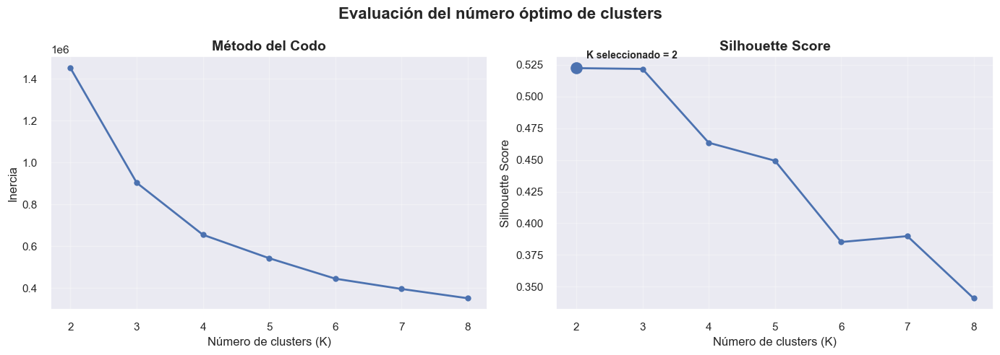

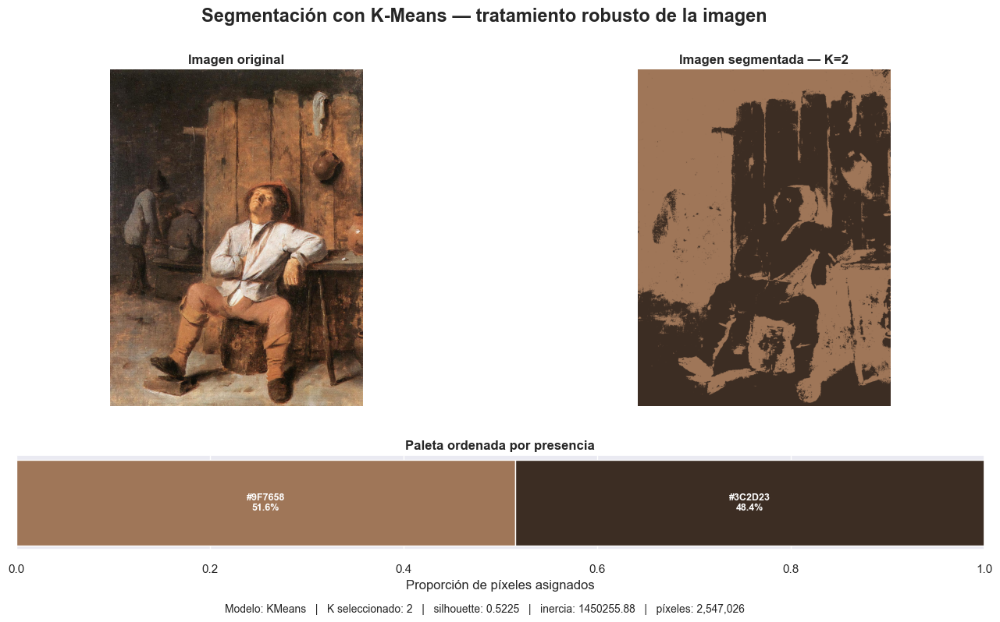


RESUMEN DEL PIPELINE K-MEANS
Archivo                : adriaen-brouwer_a-boor-asleep.jpg
Modelo                 : KMeans
K seleccionado         : 2
Silhouette             : 0.5225
Inercia                : 1450255.88
Muestra                : 12,000 píxeles
Imagen completa        : 2,547,026 píxeles
Colores                : #9F7658, #3C2D23

Pipeline KMeans ejecutado correctamente.


array([[[159, 118,  88],
        [159, 118,  88],
        [159, 118,  88],
        ...,
        [159, 118,  88],
        [159, 118,  88],
        [159, 118,  88]],

       [[159, 118,  88],
        [159, 118,  88],
        [159, 118,  88],
        ...,
        [159, 118,  88],
        [159, 118,  88],
        [159, 118,  88]],

       [[159, 118,  88],
        [159, 118,  88],
        [159, 118,  88],
        ...,
        [159, 118,  88],
        [159, 118,  88],
        [159, 118,  88]],

       ...,

       [[ 60,  45,  35],
        [ 60,  45,  35],
        [ 60,  45,  35],
        ...,
        [ 60,  45,  35],
        [ 60,  45,  35],
        [ 60,  45,  35]],

       [[ 60,  45,  35],
        [ 60,  45,  35],
        [ 60,  45,  35],
        ...,
        [ 60,  45,  35],
        [ 60,  45,  35],
        [ 60,  45,  35]],

       [[ 60,  45,  35],
        [ 60,  45,  35],
        [ 60,  45,  35],
        ...,
        [ 60,  45,  35],
        [ 60,  45,  35],
        [ 60,  45,  35]]

In [29]:
ruta_imagen_prueba = os.path.join(
    ruta,
    "adriaen-brouwer_a-boor-asleep.jpg"
)
pipeline2 = PaletaKMeansPipeline(ruta_imagen_prueba, k_range=(2, 8))
pipeline2.execute()


Iniciando pipeline KMeans con tratamiento robusto...


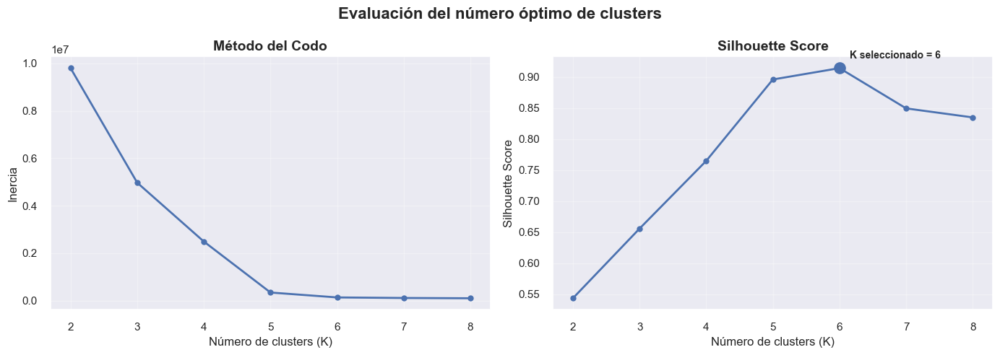

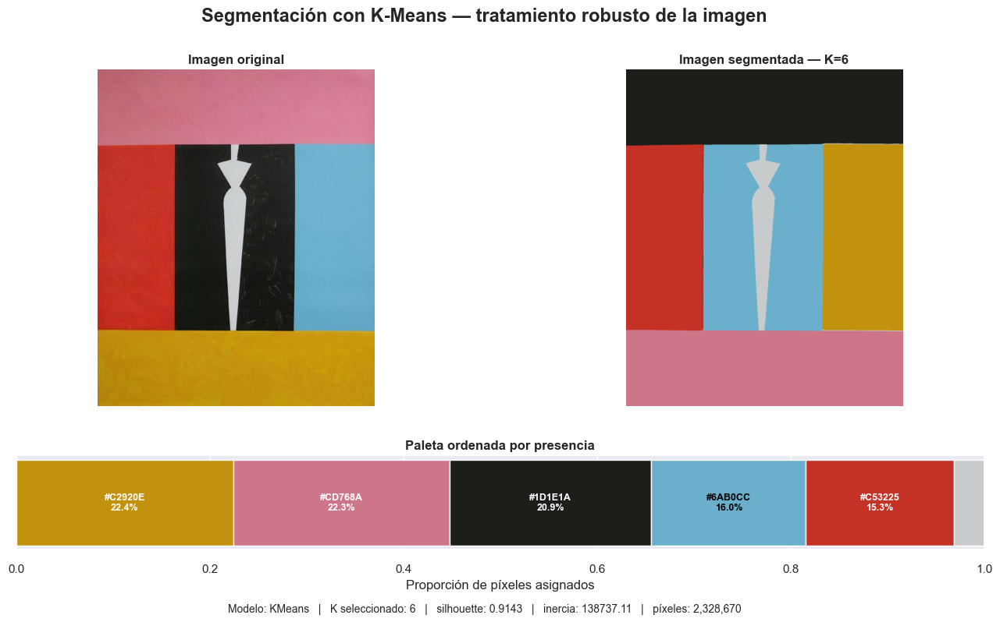


RESUMEN DEL PIPELINE K-MEANS
Archivo                : aki-kuroda_night-2011.jpg
Modelo                 : KMeans
K seleccionado         : 6
Silhouette             : 0.9143
Inercia                : 138737.11
Muestra                : 12,000 píxeles
Imagen completa        : 2,328,670 píxeles
Colores                : #C2920E, #CD768A, #1D1E1A, #6AB0CC, #C53225, #C7CBCC

Pipeline KMeans ejecutado correctamente.


array([[[ 29,  30,  26],
        [ 29,  30,  26],
        [ 29,  30,  26],
        ...,
        [ 29,  30,  26],
        [ 29,  30,  26],
        [ 29,  30,  26]],

       [[ 29,  30,  26],
        [ 29,  30,  26],
        [ 29,  30,  26],
        ...,
        [ 29,  30,  26],
        [ 29,  30,  26],
        [ 29,  30,  26]],

       [[ 29,  30,  26],
        [ 29,  30,  26],
        [ 29,  30,  26],
        ...,
        [ 29,  30,  26],
        [ 29,  30,  26],
        [ 29,  30,  26]],

       ...,

       [[205, 118, 138],
        [205, 118, 138],
        [205, 118, 138],
        ...,
        [205, 118, 138],
        [205, 118, 138],
        [205, 118, 138]],

       [[205, 118, 138],
        [205, 118, 138],
        [205, 118, 138],
        ...,
        [205, 118, 138],
        [205, 118, 138],
        [205, 118, 138]],

       [[205, 118, 138],
        [205, 118, 138],
        [205, 118, 138],
        ...,
        [205, 118, 138],
        [205, 118, 138],
        [205, 118, 138]]

In [30]:
ruta_imagen_prueba = os.path.join(
    ruta,
    "aki-kuroda_night-2011.jpg"
)
pipeline2 = PaletaKMeansPipeline(ruta_imagen_prueba, k_range=(2, 8))
pipeline2.execute()


Iniciando pipeline KMeans con tratamiento robusto...


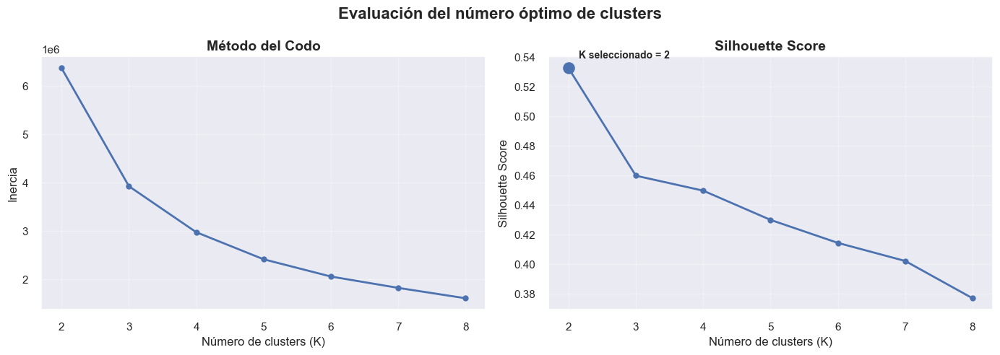

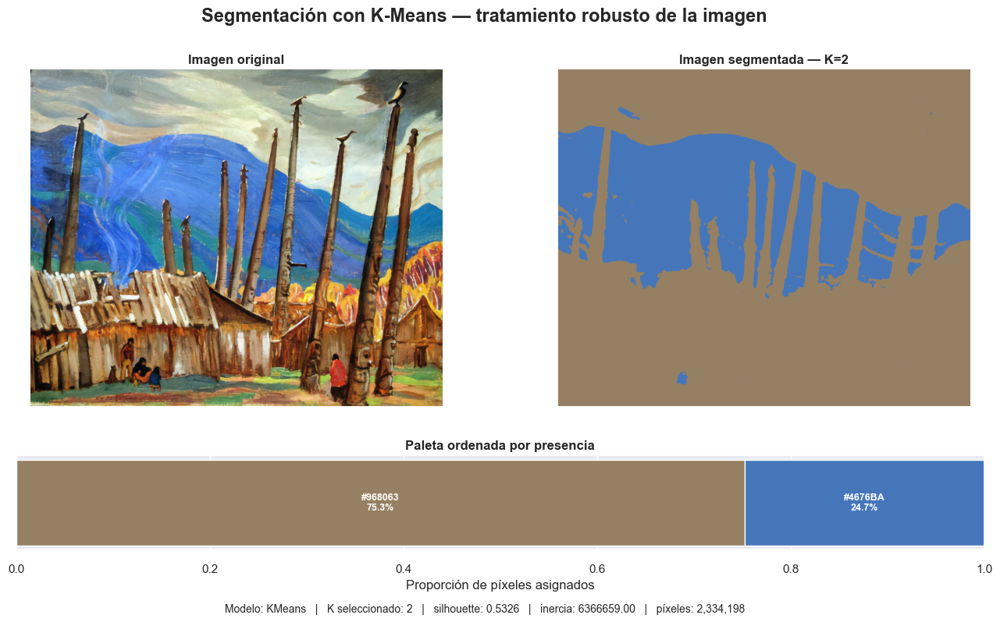


RESUMEN DEL PIPELINE K-MEANS
Archivo                : a.y.-jackson_skeena-crossing-1926.jpg
Modelo                 : KMeans
K seleccionado         : 2
Silhouette             : 0.5326
Inercia                : 6366659.00
Muestra                : 12,000 píxeles
Imagen completa        : 2,334,198 píxeles
Colores                : #968063, #4676BA

Pipeline KMeans ejecutado correctamente.


array([[[150, 128,  99],
        [150, 128,  99],
        [150, 128,  99],
        ...,
        [150, 128,  99],
        [150, 128,  99],
        [150, 128,  99]],

       [[150, 128,  99],
        [150, 128,  99],
        [150, 128,  99],
        ...,
        [150, 128,  99],
        [150, 128,  99],
        [150, 128,  99]],

       [[150, 128,  99],
        [150, 128,  99],
        [150, 128,  99],
        ...,
        [150, 128,  99],
        [150, 128,  99],
        [150, 128,  99]],

       ...,

       [[150, 128,  99],
        [150, 128,  99],
        [150, 128,  99],
        ...,
        [150, 128,  99],
        [150, 128,  99],
        [150, 128,  99]],

       [[150, 128,  99],
        [150, 128,  99],
        [150, 128,  99],
        ...,
        [150, 128,  99],
        [150, 128,  99],
        [150, 128,  99]],

       [[150, 128,  99],
        [150, 128,  99],
        [150, 128,  99],
        ...,
        [150, 128,  99],
        [150, 128,  99],
        [150, 128,  99]]

In [31]:
ruta_imagen_prueba = os.path.join(
    ruta,
    "a.y.-jackson_skeena-crossing-1926.jpg"
)
pipeline2 = PaletaKMeansPipeline(ruta_imagen_prueba, k_range=(2, 8))
pipeline2.execute()

In [38]:
def comparar_modelos_imagen(
    img_bgr,
    k_range=(3, 8),
    max_muestras=8000,
    random_state=42
):
    """Compara KMeans y HDBSCAN sobre la misma imagen.

    Retorna un resumen en DataFrame, la paleta obtenida por KMeans
    y los resultados adicionales necesarios para análisis posteriores.
    """

    # Conversión BGR → RGB
    if img_bgr is None:
        raise ValueError("La imagen no pudo ser cargada.")

    if img_bgr.ndim != 3 or img_bgr.shape[2] != 3:
        raise ValueError("La imagen debe tener tres canales BGR.")

    img_rgb = cv2.cvtColor(
        img_bgr,
        cv2.COLOR_BGR2RGB
    ).astype(np.float32) / 255.0

    px = img_rgb.reshape(-1, 3)

    # Muestreo para velocidad y estabilidad
    n = min(max_muestras, len(px))

    rng = np.random.default_rng(random_state)

    idx = rng.choice(
        len(px),
        size=n,
        replace=False
    )

    muestra_rgb = px[idx]

    # 1) KMeans: búsqueda del mejor K por silhouette
    resultados_kmeans = []

    for k in range(k_range[0], k_range[1] + 1):

        km = KMeans(
            n_clusters=k,
            random_state=random_state,
            n_init=10
        )

        labels = km.fit_predict(muestra_rgb)

        if len(np.unique(labels)) > 1:

            silhouette = silhouette_score(
                muestra_rgb,
                labels
            )

            resultados_kmeans.append({
                "K": k,
                "Silhouette": silhouette,
                "Inercia": km.inertia_
            })

    if not resultados_kmeans:
        raise ValueError(
            "No fue posible evaluar KMeans con estos parámetros."
        )

    # Selección del mejor K según silhouette
    mejor_k = max(
        resultados_kmeans,
        key=lambda x: x["Silhouette"]
    )

    best_k = mejor_k["K"]
    best_sil = mejor_k["Silhouette"]

    # Entrenamiento final de KMeans con el K seleccionado
    km_final = KMeans(
        n_clusters=best_k,
        random_state=random_state,
        n_init=10
    )

    labels_kmeans = km_final.fit_predict(muestra_rgb)
    centros = km_final.cluster_centers_

    # 2) HDBSCAN sobre espacio Lab
    img_lab = cv2.cvtColor(
        (img_rgb * 255).astype(np.uint8),
        cv2.COLOR_RGB2Lab
    ).reshape(-1, 3).astype(np.float32)

    muestra_lab = img_lab[idx]

    hdb = HDBSCAN(
        min_cluster_size=max(
            10,
            int(len(muestra_lab) * 0.01)
        ),
        min_samples=10,
        cluster_selection_method="leaf"
    )

    labels_hdbscan = hdb.fit_predict(muestra_lab)

    # Número de grupos encontrados
    clusters_hdbscan = np.unique(
        labels_hdbscan[labels_hdbscan != -1]
    )

    n_clusters_hdbscan = len(clusters_hdbscan)

    # Porcentaje de ruido
    ruido_hdbscan = np.mean(
        labels_hdbscan == -1
    )

    # Silhouette de HDBSCAN excluyendo ruido
    mascara_sin_ruido = labels_hdbscan != -1

    if (
        n_clusters_hdbscan >= 2
        and mascara_sin_ruido.sum() > 1
    ):
        silhouette_hdbscan = silhouette_score(
            muestra_lab[mascara_sin_ruido],
            labels_hdbscan[mascara_sin_ruido]
        )
    else:
        silhouette_hdbscan = np.nan

    # DataFrame comparativo
    resumen = pd.DataFrame([
        {
            "Modelo": "KMeans",
            "Clusters": best_k,
            "Silhouette": best_sil,
            "Inercia": mejor_k["Inercia"],
            "Ruido": np.nan,
            "Muestras": n
        },
        {
            "Modelo": "HDBSCAN",
            "Clusters": n_clusters_hdbscan,
            "Silhouette": silhouette_hdbscan,
            "Inercia": np.nan,
            "Ruido": ruido_hdbscan,
            "Muestras": n
        }
    ])

    # Paleta obtenida por KMeans
    porcentajes = (
        np.bincount(
            labels_kmeans,
            minlength=best_k
        ) / len(labels_kmeans)
    )

    # Ordenar colores de mayor a menor presencia
    orden = np.argsort(porcentajes)[::-1]

    centros_ordenados = centros[orden]
    porcentajes_ordenados = porcentajes[orden]

    paleta = []

    for i, (color, porcentaje) in enumerate(
        zip(centros_ordenados, porcentajes_ordenados)
    ):

        rgb = np.clip(
            np.rint(color * 255),
            0,
            255
        ).astype(np.uint8)

        hex_color = "#{:02X}{:02X}{:02X}".format(
            rgb[0],
            rgb[1],
            rgb[2]
        )

        paleta.append({
            "Cluster": i,
            "R": int(rgb[0]),
            "G": int(rgb[1]),
            "B": int(rgb[2]),
            "HEX": hex_color,
            "Porcentaje": porcentaje
        })

    paleta_kmeans = pd.DataFrame(paleta)

    # Resultados adicionales para análisis y visualización
    resultados = {
        "muestra": muestra_rgb,
        "indices_muestra": idx,
        "labels_kmeans": labels_kmeans,
        "labels_hdbscan": labels_hdbscan,
        "modelo_kmeans": km_final,
        "modelo_hdbscan": hdb,
        "evaluacion_kmeans": pd.DataFrame(resultados_kmeans)
    }

    return resumen, paleta_kmeans, resultados

img = cv2.imread(
    os.path.join(
        ruta,
        "adolf-hitler_the-munich-opera-house.jpg"
    )
)

resumen, paleta, resultados = comparar_modelos_imagen(img)

display(resumen)
display(paleta)

,Modelo,Clusters,Silhouette,Inercia,Ruido,Muestras
0,KMeans,3,0.487904,144.814545,NaN,8000
1,HDBSCAN,14,0.301194,NaN,0.7415,8000


,Cluster,R,G,B,HEX,Porcentaje
0,0,170,180,177,#AAB4B1,0.468000
1,1,128,134,130,#808682,0.349875
2,2,75,68,59,#4B443B,0.182125


Se realiza un segundo pipeline de datos para el modelo Kmeans sin realizar tanto preprocesamiento en los datos o pixeles para revisar su funcionamiento bajo imagenes con paletas simples

In [ ]:
# Creación de la clase Pipeline para ajustar los datos, entrenar el modelo y segmentar la imagen con kmeans - modelo sencillo

class ColorClusterPipeline:
    """Pipeline clásico de K-Means para segmentación por color.

    Esta clase sirve para reproducir un flujo de trabajo sencillo y legible:
        1. convertir la imagen a RGB,
        2. normalizar los valores de los píxeles,
        3. muestrear una porción de datos para evaluar K,
        4. seleccionar K con silhouette score,
        5. entrenar el modelo final sobre la imagen completa,
        6. reconstruir la imagen segmentada y visualizar el resultado.

    Se incluyó como referencia comparativa porque produce una paleta similar a la de KMeans
    robusto, pero con menos procesamiento y sin la misma estructura de validación perceptual.
    """

    def __init__(self, image, k_range=(2, 10), sample_size=5000):
        self.image = image

        # Configuración
        self.k_range = range(k_range[0], k_range[1] + 1)
        self.sample_size = sample_size
        self.random_state = 42
        # Datos
        self.image_rgb = None
        self.image_norm = None
        self.data = None
        self.sample = None
        # Evaluación
        self.results = []
        self.inertias = []
        self.silhouettes = []
        # Modelo final
        self.best_k = None
        self.best_model = None
        # Resultado
        self.clustered_img = None

    # 1. PREPROCESAMIENTO
    def preprocess(self):
        """Convierte la imagen de BGR a RGB, normaliza los valores y la vectoriza como una matriz N x 3.

        Esta etapa sirve para preparar la imagen para que KMeans pueda operar sobre los píxeles como
        observaciones. La normalización evita que el rango de intensidad de los canales domine la
        distancia euclidiana del algoritmo.
        """
        self.image_rgb = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        self.image_norm = (self.image_rgb.astype(np.float32) / 255.0)
        self.data = self.image_norm.reshape(-1, 3)
        return self.data

    # 2. MUESTREO
    def create_sample(self):
        """Genera una muestra representativa de píxeles para evaluar K de forma eficiente.

        Esta etapa sirve para acelerar la comparación de varios valores de K sin entrenar el modelo
        sobre todos los píxeles a cada momento. Se usa una semilla fija para garantizar reproducibilidad.
        """
        rng = np.random.default_rng(self.random_state)
        n_samples = min(self.sample_size, len(self.data))
        indices = rng.choice(len(self.data), size=n_samples, replace=False)
        self.sample = self.data[indices]
        return self.sample

    # 3. EVALUACIÓN DE K
    def evaluate_k(self):
        """Evalúa varios valores de K y calcula inercia y silhouette score para cada uno.

        Esta etapa sirve para seleccionar el número de clusters con una métrica de calidad. El objetivo
        es comparar qué tan bien los grupos están compactados y separados entre sí.
        """
        self.results = []
        self.inertias = []
        self.silhouettes = []
        for k in self.k_range:
            model = KMeans(
                n_clusters=k,
                max_iter=300,
                n_init=10,
                random_state=self.random_state,
            )
            model.fit(self.sample)
            inertia = model.inertia_
            silhouette = silhouette_score(self.sample, model.labels_)
            self.inertias.append(inertia)
            self.silhouettes.append(silhouette)
            self.results.append({
                "k": k,
                "model": model,
                "inertia": inertia,
                "silhouette": silhouette,
            })
        return self.results

    # 4. SELECCIÓN DE K
    def select_best_k(self):
        """Selecciona el valor de K que obtuvo el mayor silhouette score.

        Esta etapa sirve para decidir el número de clusters más adecuado según la separación entre grupos.
        """
        best_index = np.argmax(self.silhouettes)
        self.best_k = list(self.k_range)[best_index]
        return self.best_k

    # 5. ENTRENAMIENTO DEL MODELO FINAL
    def fit_final_model(self):
        """Entrena el modelo definitivo con el K elegido sobre toda la imagen.

        Esta etapa sirve para producir la segmentación final en el conjunto completo de píxeles y no solo
        en la muestra de evaluación.
        """
        if self.best_k is None:
            raise ValueError("Primero debes seleccionar el mejor K.")
        
        self.best_model = KMeans(
            n_clusters=self.best_k,
            max_iter=300,
            n_init=10,
            random_state=self.random_state,
        )
        self.best_model.fit(self.data)
        return self.best_model

    # 6. SEGMENTACIÓN
    def segment_image(self):
        """Asigna cada píxel a su centroide y reconstruye la imagen segmentada.

        Esta etapa sirve para transformar el resultado del clustering en una imagen visual capaz de
        mostrarse y compararse con la imagen original.
        """
        if self.best_model is None:
            raise ValueError("Primero debes entrenar el modelo final.")

        labels = self.best_model.predict(self.data)
        clustered = self.best_model.cluster_centers_[labels]
        self.clustered_img = clustered.reshape(self.image_rgb.shape)
        return self.clustered_img

    # 7. VISUALIZACIÓN DE MÉTRICAS
    def plot_metrics(self):
        """Muestra el codo y la silueta para diagnosticar la elección de K.

        Esta etapa sirve para justificar visualmente la decisión del número de clusters y facilitar la
        interpretación del ajuste del modelo.
        """
        ks = list(self.k_range)
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        axes[0].plot(ks, self.inertias, marker="o", linewidth=2)
        axes[0].set_title("Método del Codo", fontsize=14, fontweight="bold")
        axes[0].set_xlabel("Número de clusters (K)")
        axes[0].set_ylabel("Inercia")
        axes[0].grid(True, alpha=0.3)
        axes[0].set_xticks(ks)
        axes[1].plot(ks, self.silhouettes, marker="o", linewidth=2)
        axes[1].set_title("Silhouette Score", fontsize=14, fontweight="bold")
        axes[1].set_xlabel("Número de clusters (K)")
        axes[1].set_ylabel("Silhouette Score")
        axes[1].grid(True, alpha=0.3)
        axes[1].set_xticks(ks)

        if self.best_k is not None:
            best_index = list(self.k_range).index(self.best_k)
            axes[1].scatter(self.best_k, self.silhouettes[best_index], s=120, zorder=5)
            axes[1].annotate(
                f"K seleccionado = {self.best_k}",
                (self.best_k, self.silhouettes[best_index]),
                xytext=(10, 10),
                textcoords="offset points",
                fontsize=10,
                fontweight="bold",
            )

        fig.suptitle("Evaluación del número óptimo de clusters", fontsize=16, fontweight="bold")
        plt.tight_layout()
        plt.show()

    # 8. VISUALIZACIÓN DE RESULTADOS
    def visualize_result(self):
        """Muestra la imagen original y la segmentada con un resumen del modelo.

        Esta etapa sirve para validar si la segmentación obtenida es útil desde el punto de vista visual.
        """
        if self.clustered_img is None:
            raise ValueError("Primero debes segmentar la imagen.")

        best_index = list(self.k_range).index(self.best_k)
        inertia = self.inertias[best_index]
        silhouette = self.silhouettes[best_index]
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))

        axes[0].imshow(self.image_rgb)
        axes[0].set_title("Imagen Original", fontsize=15, fontweight="bold")
        axes[0].axis("off")
        axes[1].imshow(self.clustered_img)
        axes[1].set_title(f"Imagen Segmentada — K={self.best_k}", fontsize=15, fontweight="bold")
        axes[1].axis("off")

        summary = (
            f"RESUMEN DEL MODELO\n\n"
            f"K seleccionado: {self.best_k}    |    "
            f"Modelo: K-Means    |    "
            f"Silhouette Score: {silhouette:.4f}    |    "
            f"Inercia: {inertia:.2f}    |    "
            f"Píxeles: {len(self.data):,}"
        )
        fig.text(
            0.5,
            0.035,
            summary,
            ha="center",
            va="bottom",
            fontsize=11,
            bbox=dict(boxstyle="round,pad=0.8", alpha=0.08),
        )
        fig.suptitle("Segmentación de Imagen mediante K-Means", fontsize=18, fontweight="bold")
        plt.tight_layout(rect=[0, 0.18, 1, 0.93])
        plt.show()

    # 9. RESUMEN EN CONSOLA
    def print_summary(self):
        """Imprime un resumen breve del resultado final del pipeline.

        Esta etapa sirve para dejar un reporte textual del ajuste realizado y sus métricas principales.
        """
        best_index = list(self.k_range).index(self.best_k)

        print("\n" + "=" * 50)
        print("RESUMEN DEL PIPELINE")
        print("=" * 50)
        print(f"K seleccionado       : {self.best_k}")
        print("Modelo               : K-Means")
        print(f"Silhouette Score     : {self.silhouettes[best_index]:.4f}")
        print(f"Inercia              : {self.inertias[best_index]:.2f}")
        print(f"Número de píxeles    : {len(self.data):,}")
        print("=" * 50)

    # 10. EJECUCIÓN COMPLETA
    def execute(self):
        """Ejecuta el flujo completo del pipeline de referencia.

        Esta función sirve para correr todo el proceso en una sola llamada, manteniendo la lógica simple
        y fácil de seguir del KMeans tradicional.
        """
        print("\nIniciando pipeline...")
        self.preprocess()
        self.create_sample()
        self.evaluate_k()
        self.select_best_k()
        self.plot_metrics()
        self.fit_final_model()
        self.segment_image()
        self.visualize_result()
        self.print_summary()

        print("\nPipeline ejecutado correctamente.")
        return self.clustered_img



Iniciando pipeline...


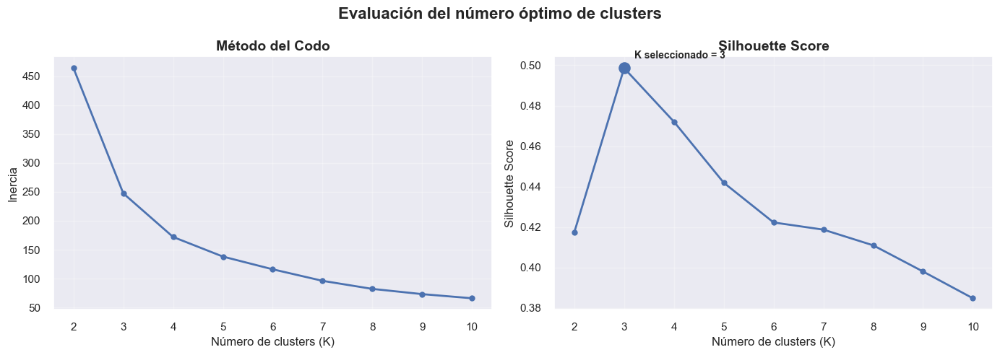

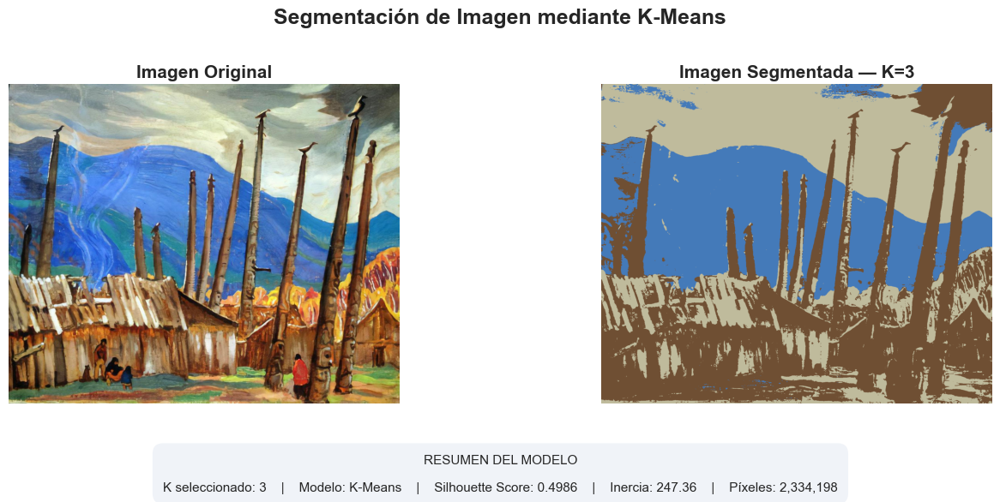


RESUMEN DEL PIPELINE
K seleccionado       : 3
Modelo               : K-Means
Silhouette Score     : 0.4986
Inercia              : 247.36
Número de píxeles    : 2,334,198

Pipeline ejecutado correctamente.


array([[[0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        ...,
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ]],

       [[0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        ...,
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ]],

       [[0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        ...,
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ],
        [0.437, 0.31 , 0.2  ]],

       ...,

       [[0.75 , 0.735, 0.615],
        [0.75 , 0.735, 0.615],
        [0.75 , 0.735, 0.615],
        ...,
        [0.75 , 0.735, 0.615],
        [0.75 , 0.735, 0.615],
        [0.75 , 0.735, 0.615]],

       [[0.75 , 0.735, 0.615],
        [0.75 , 0.735, 0.615],
        [0.75 , 0.735, 0.615],
        ...,
        [0.75 , 0.735, 0.615],
        [0.437, 0.31 , 0.2  ],
        [0.75 ,

In [35]:
ruta_imagen_prueba = os.path.join(ruta, "a.y.-jackson_skeena-crossing-1926.jpg")
img = cv2.imread(ruta_imagen_prueba)

pipeline4 = ColorClusterPipeline(img)
pipeline4.execute()

## **Comparación final: HDBSCAN vs KMeans**

Este proyecto compara dos enfoques complementarios para extraer una paleta cromática. HDBSCAN identifica regiones densas sin imponer un número fijo de grupos y puede marcar como ruido las variaciones aisladas. Por ello, es conveniente para imágenes con sombras, degradados y muchos matices.

KMeans agrupa los píxeles alrededor de centroides y selecciona automáticamente `K` mediante el Silhouette Score. Produce una paleta más compacta, estable y fácil de comunicar, aunque no separa ruido de forma nativa y depende del rango de valores evaluado.

La diferencia observada entre ambos resultados se explica por el espacio de representación y por el criterio de agrupamiento: HDBSCAN busca densidades cromáticas, mientras KMeans busca particiones alrededor de centroides. Por tanto, un valor de `K` diferente no implica necesariamente un error; refleja una lectura distinta de la misma imagen. En la prueba realizada, el pipeline robusto seleccionó `K=2`, mientras el pipeline simplificado seleccionó `K=3` con un Silhouette Score de `0.4986`. Esta variación es coherente con que el pipeline robusto incorpora CIELAB, tratamiento del ruido y una preparación más elaborada, mientras que el simplificado trabaja directamente con RGB normalizado.

| Criterio | HDBSCAN | KMeans |
|---|---|---|
| Número de grupos | Se descubre automáticamente | Se selecciona mediante silhouette |
| Manejo del ruido | Identifica observaciones de baja densidad | Asigna todos los píxeles a un grupo |
| Paleta | Más detallada y flexible | Más compacta y controlada |
| Interpretabilidad | Requiere mayor análisis | Directa y sencilla |
| Uso recomendado | Riqueza cromática y matices | Síntesis visual y reproducibilidad |

### **Conclusión**

La elección depende del objetivo: HDBSCAN es preferible cuando se busca representar la estructura cromática natural de la imagen; KMeans, cuando se necesita una paleta resumida y operativa. El pipeline simplificado se conserva como referencia porque permite obtener una solución comparable con menor procesamiento, mientras que el pipeline robusto ofrece mayor control metodológico y una representación más cercana a la percepción del color. Ambos modelos utilizan el mismo flujo de preparación en la comparación principal, por lo que no existe un modelo universalmente superior: el mejor método es el que responde con mayor claridad al propósito del análisis.
